In [1]:
import os
import time
import glob
import warnings
from collections import Counter
from matplotlib import pyplot
from numpy import where
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import torch

from sklearn.preprocessing import normalize, LabelEncoder, OrdinalEncoder,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report,
    precision_score,
    recall_score,
    confusion_matrix,
    f1_score,
    accuracy_score,
    precision_recall_fscore_support,
    ConfusionMatrixDisplay,
    roc_curve,
    auc)

from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.utils import class_weight
from sklearn.datasets import make_classification

import tensorflow as tf
from tensorflow import keras
from keras.utils import to_categorical
from tensorflow.keras import layers, callbacks
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Input, Dense, Dropout, Flatten, Activation, BatchNormalization,
    Conv1D, MaxPooling1D, GlobalMaxPooling1D, AveragePooling1D,
    Reshape, LSTM, GRU, Embedding
)
from tensorflow.keras.preprocessing import text, sequence
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import layers, Input, models

import keras_tuner as kt
from scipy.signal import welch
import mne
import shap
warnings.filterwarnings('ignore')
#!pip install --upgrade scikit-learn
#!pip install --upgrade imbalanced-learn
from imblearn.over_sampling import ADASYN,SMOTE

2025-05-24 17:53:14.770237: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748109194.794782      92 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748109194.803813      92 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# **EEG Participant Data Statistics**

In [2]:
file_path = '/kaggle/input/open-nuro-dataset/dataset/participants.tsv'
eeg_participant = pd.read_csv(file_path, sep='\t')
print(eeg_participant.head(3))

  participant_id Gender  Age Group  MMSE
0        sub-001      F   57     A    16
1        sub-002      F   78     A    22
2        sub-003      M   70     A    14


In [3]:
print(eeg_participant.tail(3))

   participant_id Gender  Age Group  MMSE
85        sub-086      M   49     F    26
86        sub-087      M   73     F    24
87        sub-088      M   55     F    24


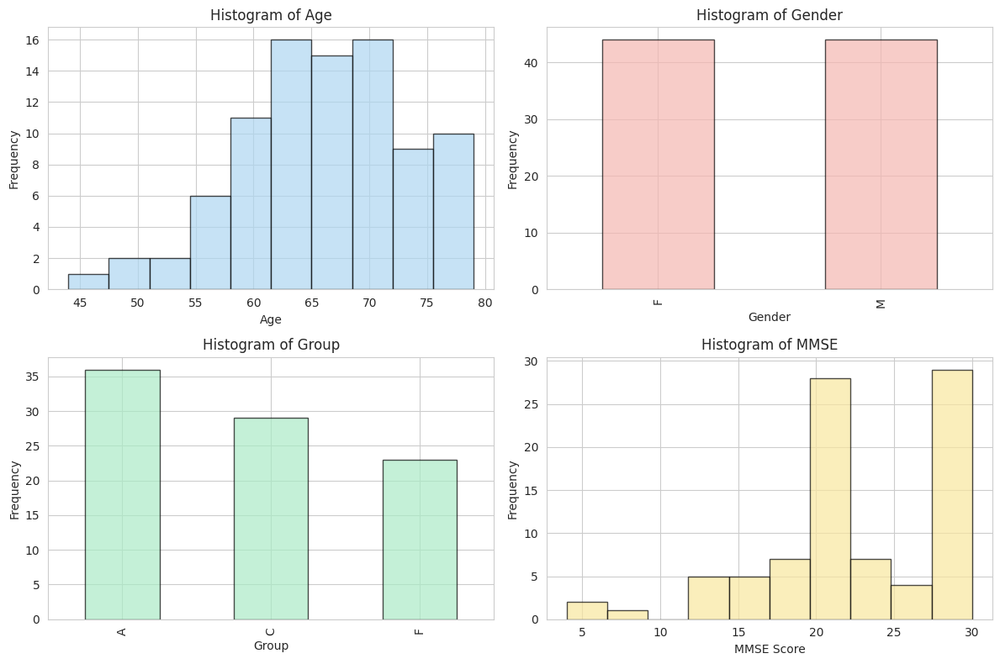

In [4]:
sns.set_style("whitegrid")
colors = ['#AED6F1', '#F5B7B1', '#ABEBC6', '#F9E79F']  
plt.figure(figsize=(12, 8))

# Histogram for Age
plt.subplot(2, 2, 1)
plt.hist(eeg_participant['Age'], bins=10, edgecolor='black', color=colors[0], alpha=0.7)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Histogram of Age')

# Bar plot for Gender
plt.subplot(2, 2, 2)
eeg_participant['Gender'].value_counts().plot(kind='bar', edgecolor='black', color=colors[1], alpha=0.7)
plt.xlabel('Gender')
plt.ylabel('Frequency')
plt.title('Histogram of Gender')

# Bar plot for Group
plt.subplot(2, 2, 3)
eeg_participant['Group'].value_counts().plot(kind='bar', edgecolor='black', color=colors[2], alpha=0.7)
plt.xlabel('Group')
plt.ylabel('Frequency')
plt.title('Histogram of Group')

# Histogram for MMSE Score
plt.subplot(2, 2, 4)
plt.hist(eeg_participant['MMSE'], bins=10, edgecolor='black', color=colors[3], alpha=0.7)
plt.xlabel('MMSE Score')
plt.ylabel('Frequency')
plt.title('Histogram of MMSE')
plt.tight_layout()
plt.show()


# **EEG Data Veiw**

**Alzheimer EEG**

Using matplotlib as 2D backend.


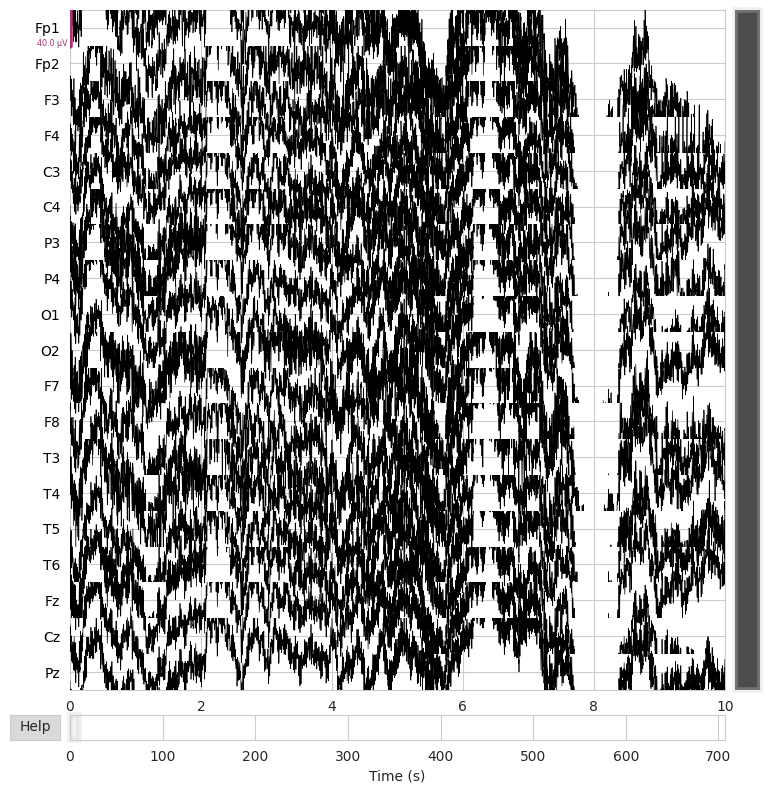

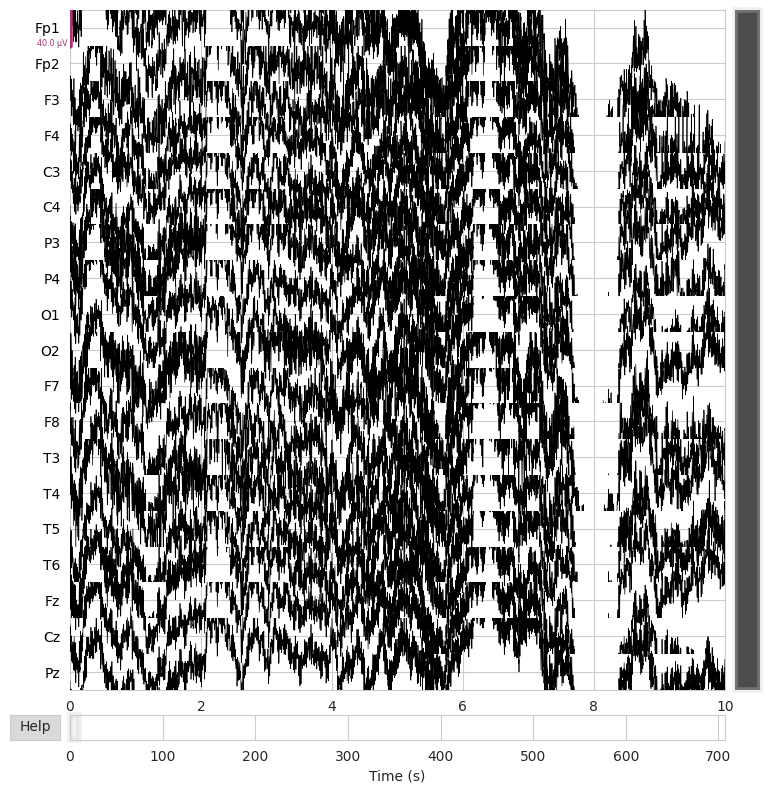

In [5]:
file_path = '/kaggle/input/open-nuro-dataset/dataset/sub-004/eeg/sub-004_task-eyesclosed_eeg.set'
raw = mne.io.read_raw_eeglab(file_path, preload=True)
raw.plot()

**ICA components EEG Alzheimer**

In [6]:
ica = mne.preprocessing.ICA(random_state=42, n_components=19)
ica.fit(raw.copy().filter(1,None, verbose=False), verbose=False)

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,39 iterations on raw data (353550 samples)
ICA components,19
Available PCA components,19
Channel types,eeg
ICA components marked for exclusion,—


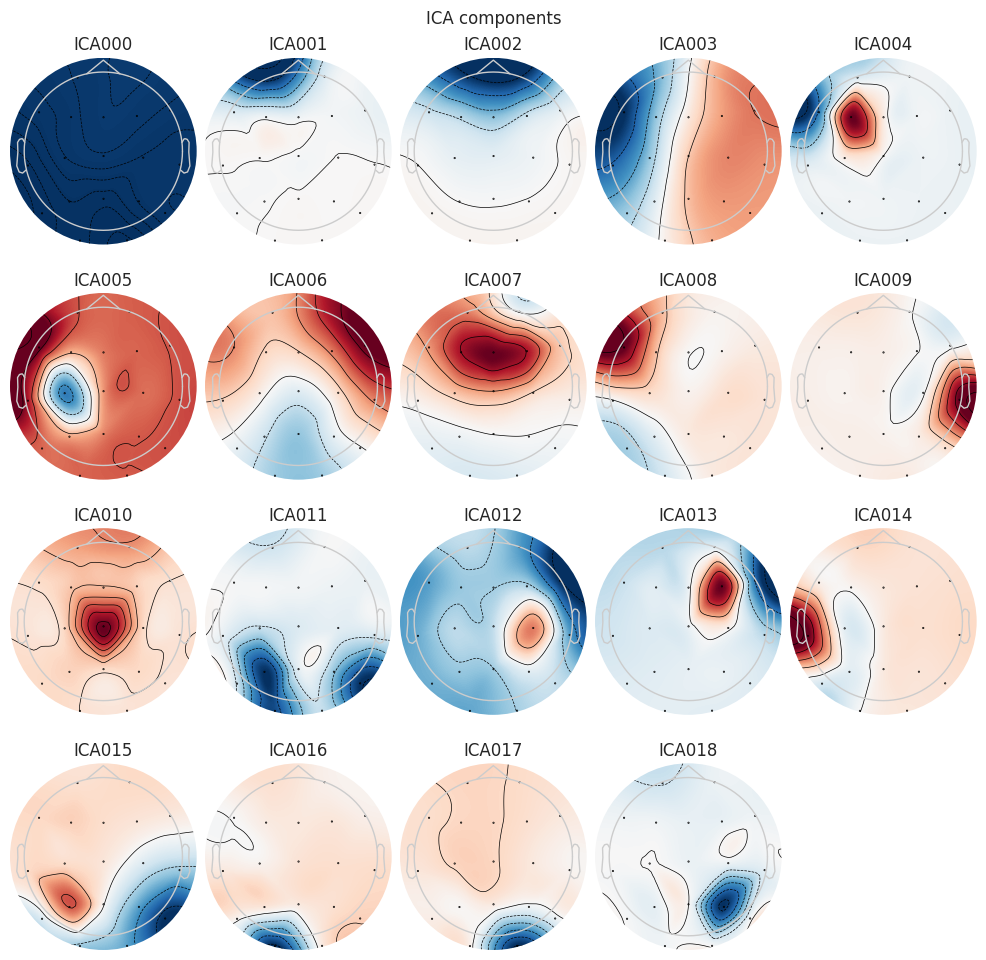

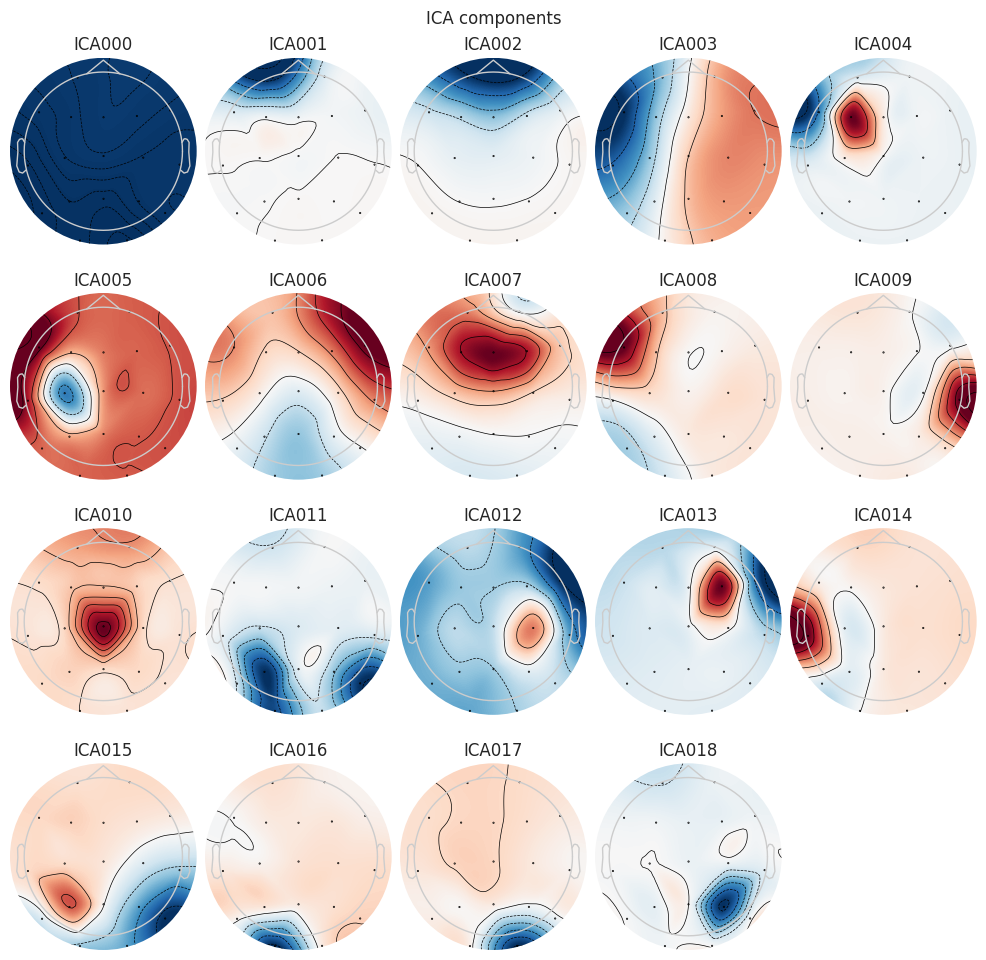

In [7]:
ica.plot_components()

**Healthy EEG**

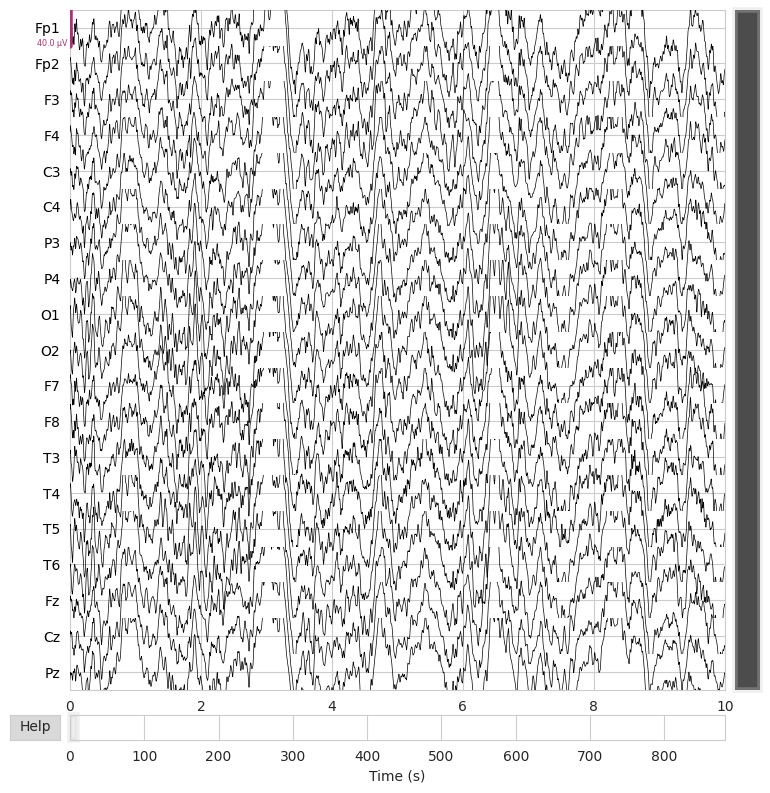

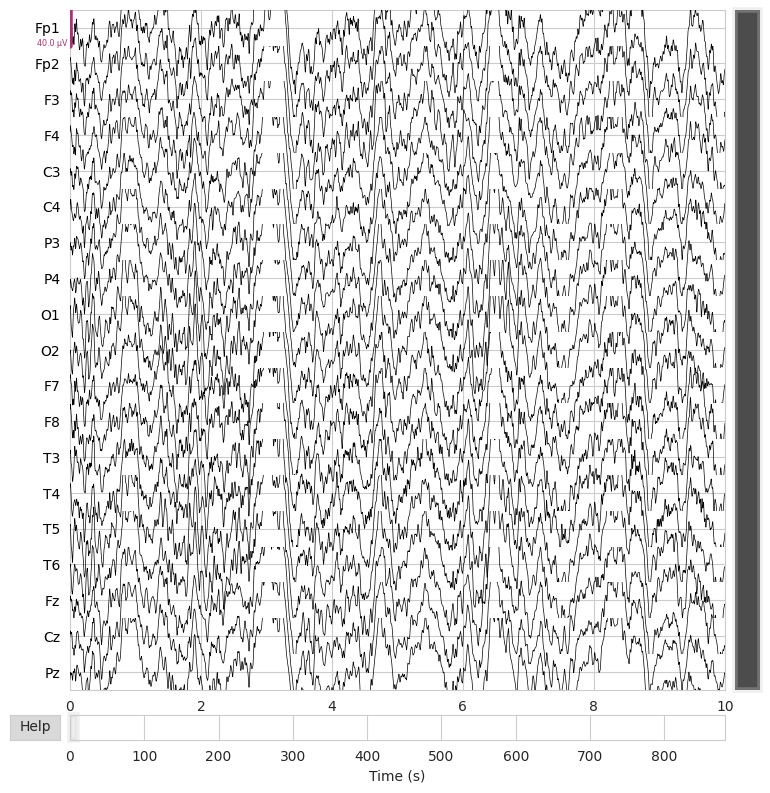

In [8]:
file_path = '/kaggle/input/open-nuro-dataset/dataset/derivatives/sub-044/eeg/sub-044_task-eyesclosed_eeg.set'
raw = mne.io.read_raw_eeglab(file_path, preload=True)
raw.plot()

**ICA components EEG Healthy**

In [9]:
ica = mne.preprocessing.ICA(random_state=42, n_components=19)
ica.fit(raw.copy().filter(1,None, verbose=False), verbose=False)

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,22 iterations on raw data (440800 samples)
ICA components,19
Available PCA components,19
Channel types,eeg
ICA components marked for exclusion,—


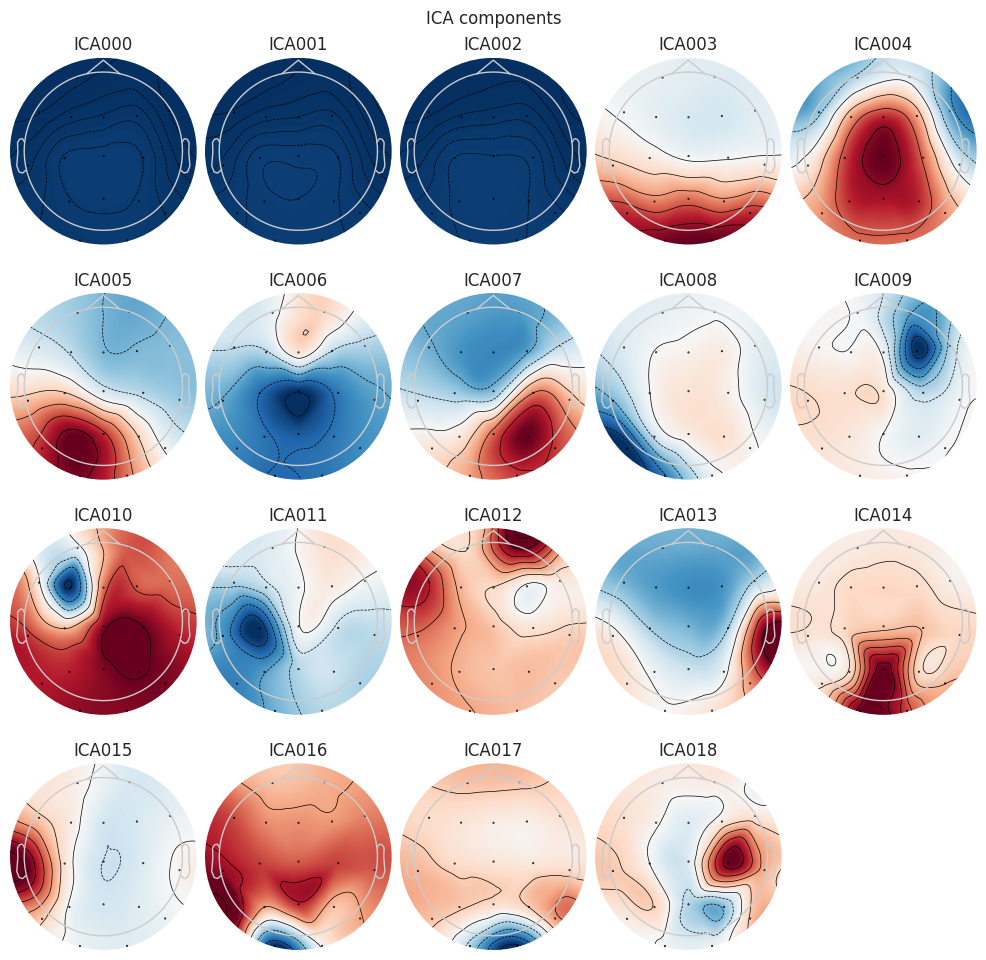

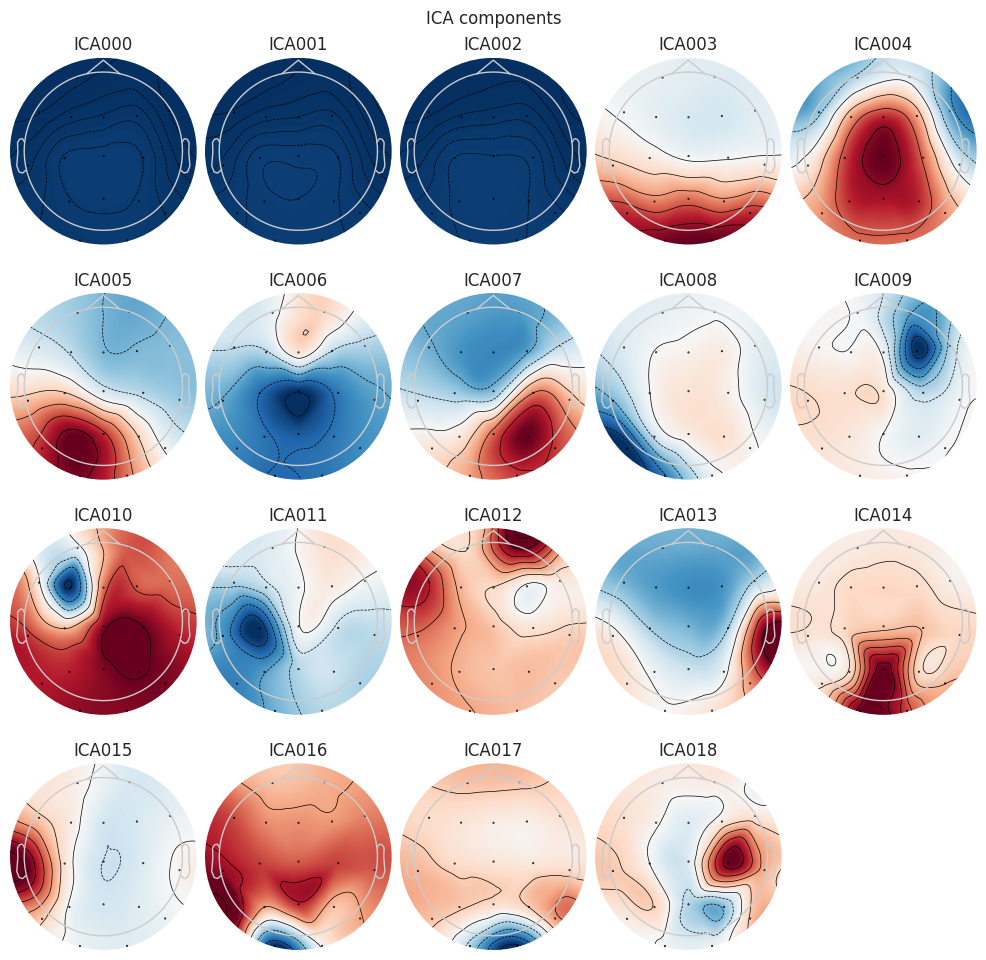

In [10]:
ica.plot_components()

**Dementia EEG**

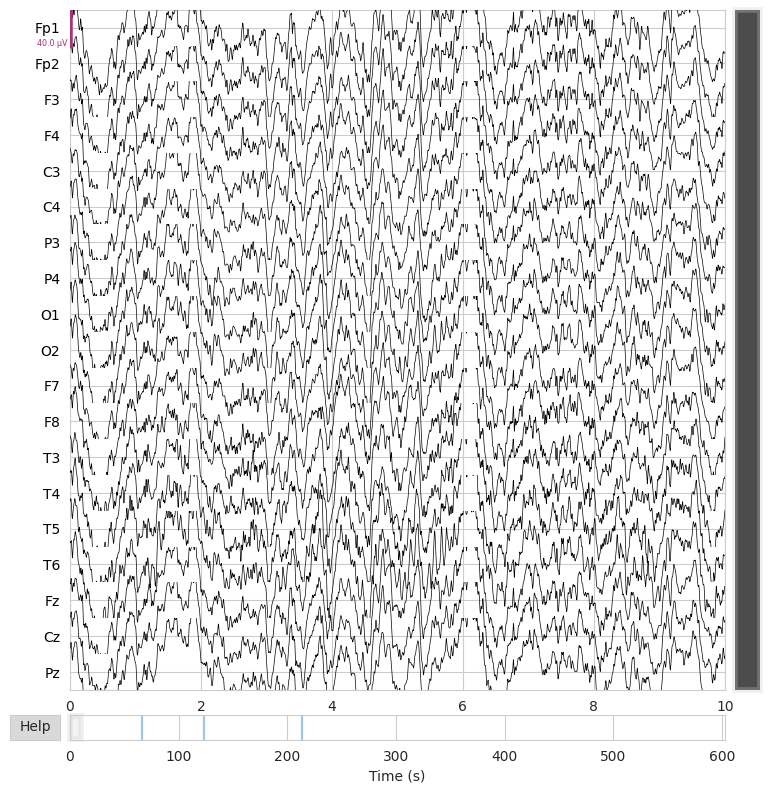

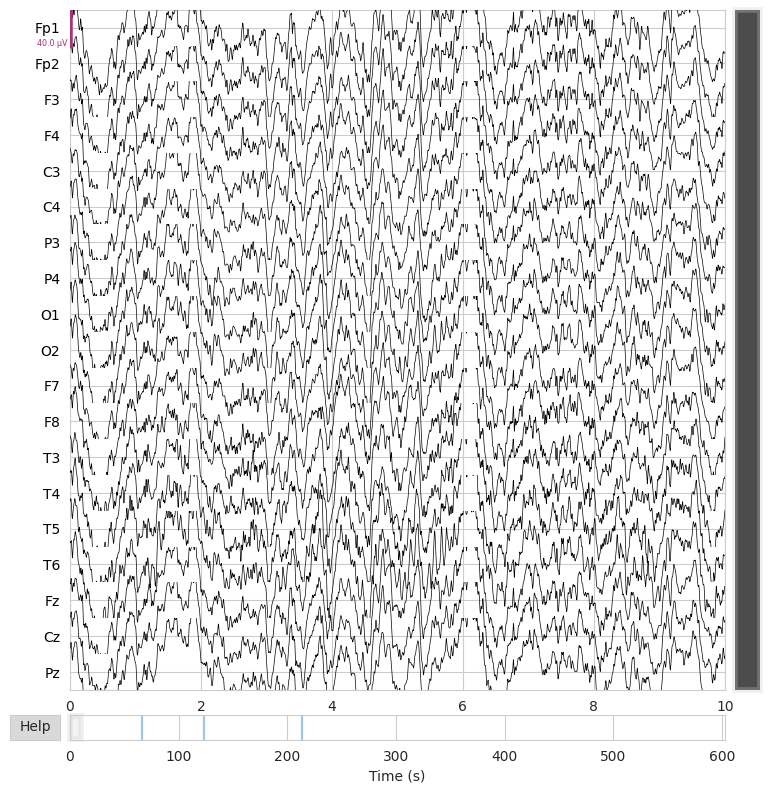

In [11]:
file_path = '/kaggle/input/open-nuro-dataset/dataset/derivatives/sub-087/eeg/sub-087_task-eyesclosed_eeg.set'
raw = mne.io.read_raw_eeglab(file_path, preload=True)
raw.plot()

**ICA components EEG Dementia**

In [12]:
ica = mne.preprocessing.ICA(random_state=42, n_components=19)
ica.fit(raw.copy().filter(1,None, verbose=False), verbose=False)

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,41 iterations on raw data (301380 samples)
ICA components,19
Available PCA components,19
Channel types,eeg
ICA components marked for exclusion,—


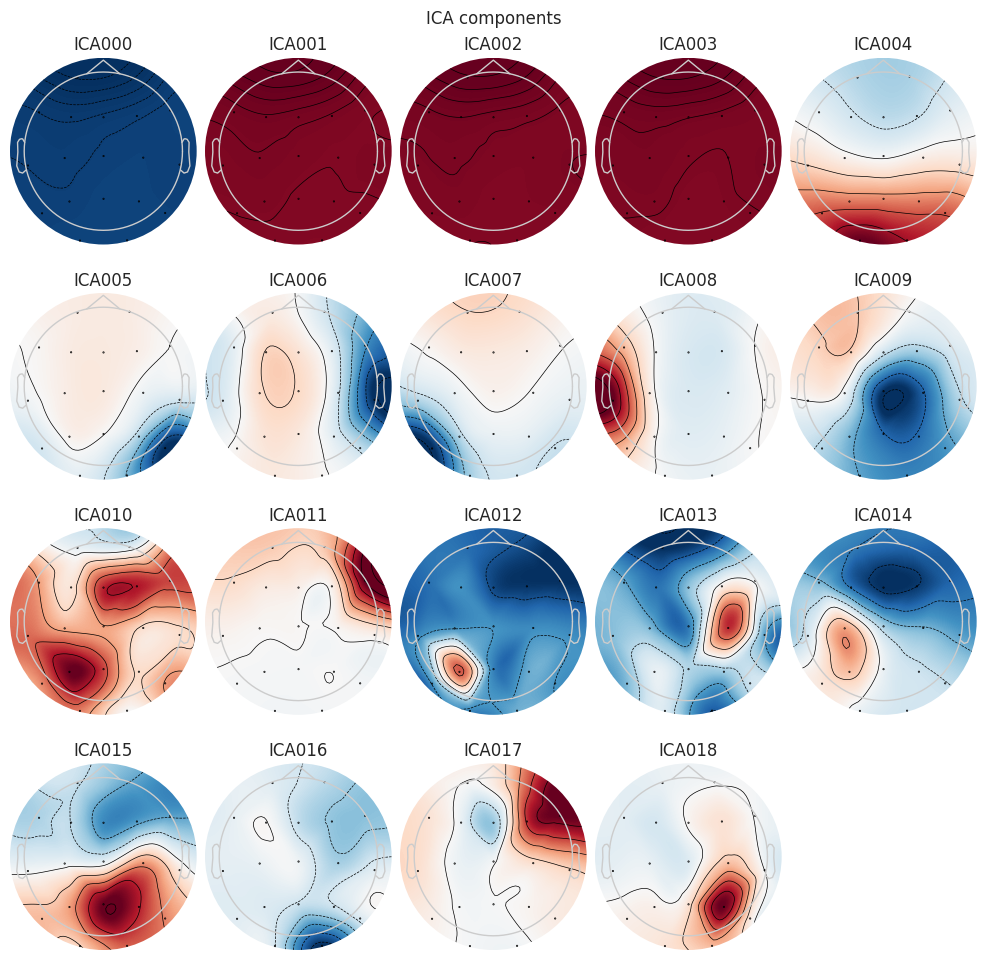

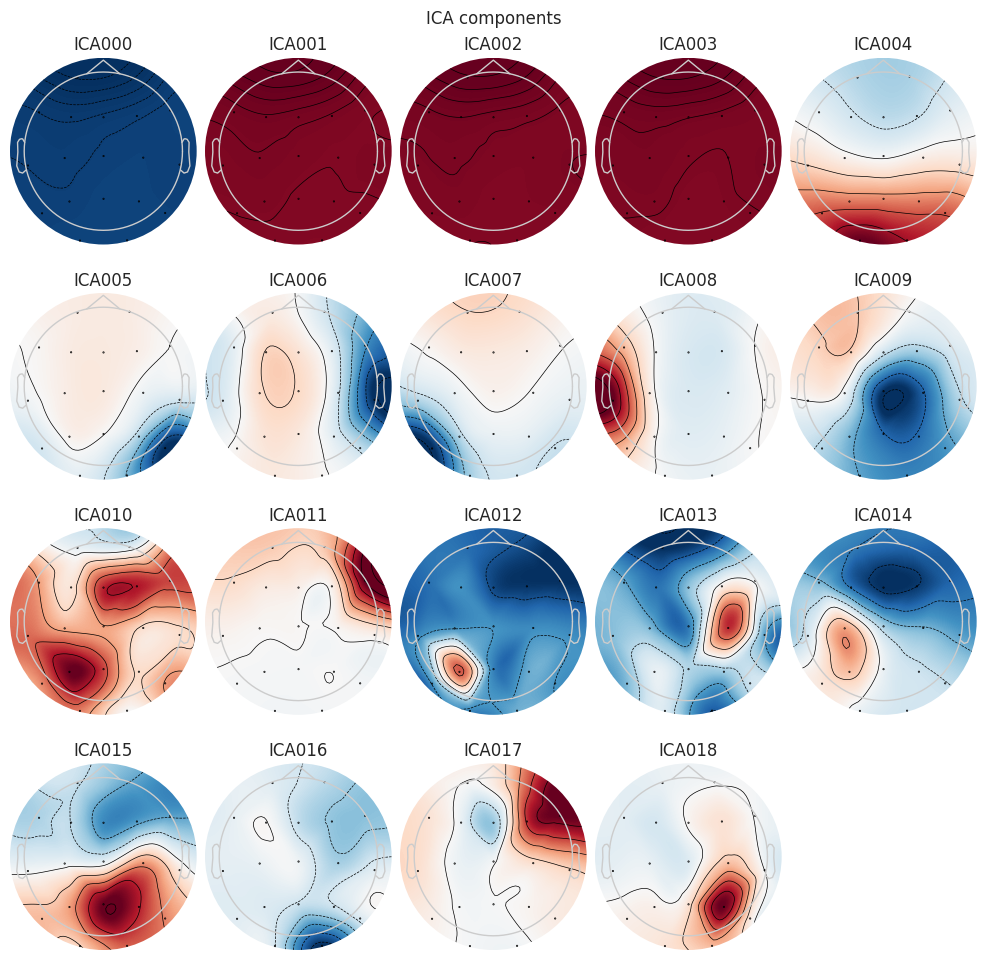

In [13]:
ica.plot_components()

**Feature Extraction Alzheimer's EEG**

In [14]:
bands = {
    "Delta": (0.5, 4),
    "Theta": (4, 8),
    "Alpha": (8, 16),
    "Zaeta": (16, 24),
    "Beta": (24, 30),
    "Gamma": (30, 45)
}

def calculate_rbp(eeg_data, sampling_rate, bands):
    full_range = (0.5, 45)
    
    # Epoch length and overlap
    epoch_length = int(6 * sampling_rate)  # 2 seconds
    step = epoch_length // 2  # 50% overlap
    n_samples = eeg_data.shape[1]
    epochs = np.array([
        eeg_data[:, i:i + epoch_length]
        for i in range(0, n_samples - epoch_length + 1, step)
    ])
    
    rbp_features = []
    
    for epoch in epochs:
        epoch_rbp = []
        for channel in epoch:
            freqs, psd = welch(channel, fs=sampling_rate, nperseg=256)
            
            # Total PSD for the full frequency range
            total_psd = np.sum(psd[(freqs >= full_range[0]) & (freqs <= full_range[1])])
            if total_psd == 0:
                continue  # Skip if total PSD is zero to avoid division by zero
            
            # Calculate RBP for each band
            rbp = [
                np.sum(psd[(freqs >= low) & (freqs < high)]) / total_psd
                for low, high in bands.values()
            ]
            epoch_rbp.append(rbp)
        
        # Average RBP across all channels for the epoch
        if epoch_rbp:
            rbp_features.append(np.mean(epoch_rbp, axis=0))
    
    return rbp_features
#/kaggle/input/eeg-open-eye/EEG_open_eye/derivatives/eeglab/sub-001/eeg/sub-001_task-photomark_eeg.set
# List of file paths for participants 1 to 35
file_paths = [
    f'/kaggle/input/open-nuro-dataset/dataset/derivatives/sub-{i:03d}/eeg/sub-{i:03d}_task-eyesclosed_eeg.set'
    for i in range(1, 36)
]

# Initialize a list to store features for all files
all_rbp_features = []

# Use tqdm to show a progress bar
for file_path in tqdm(file_paths, desc="Processing EEG files", unit="file"):
    try:
        # Load the EEG data
        raw = mne.io.read_raw_eeglab(file_path, preload=True)
        
        # Extract EEG data and sampling frequency
        eeg_data, sampling_rate = raw.get_data(), raw.info['sfreq']
        
        # Check if the sampling rate is 500 Hz
        if sampling_rate != 500:
            print(f"Warning: Sampling rate mismatch in file {file_path}")
        
        # Calculate RBP features
        rbp_features = calculate_rbp(eeg_data, sampling_rate, bands)
        
        # Convert RBP features into a DataFrame
        columns = ["Delta", "Theta", "Alpha", "Zaeta", "Beta", "Gamma"]
        rbp_df = pd.DataFrame(rbp_features, columns=columns)
        
        # Add labels to the DataFrame
        label = "AD"  # Label for Alzheimer's Disease
        rbp_df["Label"] = label
        
        # Append features to the main list
        all_rbp_features.append(rbp_df)
    
    except Exception as e:
        print(f"Error processing file {file_path}: {e}")

# Combine all DataFrames into one
final_rbp_df = pd.concat(all_rbp_features, ignore_index=True)

# Save to CSV
output_path = '/kaggle/working/Alzheimer.csv'
final_rbp_df.to_csv(output_path, index=False)

print(f"RBP features for files 1 to 35 saved to {output_path}")

Processing EEG files:   0%|          | 0/35 [00:00<?, ?file/s]

RBP features for files 1 to 35 saved to /kaggle/working/Alzheimer.csv


**Feature Extraction Healthy's EEG**

In [15]:
file_paths = [
    f'/kaggle/input/open-nuro-dataset/dataset/derivatives/sub-{i:03d}/eeg/sub-{i:03d}_task-eyesclosed_eeg.set'
    for i in range(36, 65)
]

all_rbp_features = []

# Use tqdm to show a progress bar
for idx, file_path in tqdm(enumerate(file_paths), desc="Processing EEG files", unit="file"):
    try:
        # Load the EEG data
        raw = mne.io.read_raw_eeglab(file_path, preload=True)
        
        # Extract EEG data and sampling frequency
        eeg_data, sampling_rate = raw.get_data(), raw.info['sfreq']
        
        # Calculate RBP features
        rbp_features = calculate_rbp(eeg_data, sampling_rate, bands)
        
        # Convert RBP features into a DataFrame
        columns = ["Delta", "Theta", "Alpha", "Beta", "Zaeta", "Gamma"]
        rbp_df = pd.DataFrame(rbp_features, columns=columns)
        
        # Add labels to the DataFrame (label "C" normal for files 37 to 65)
        label = "C"
        rbp_df["Label"] = label
        
        # Append features to the main list
        all_rbp_features.append(rbp_df)
    
    except Exception as e:
        print(f"Error processing file {file_path}: {e}")

# Combine all DataFrames into one
final_rbp_df = pd.concat(all_rbp_features, ignore_index=True)

output_path = '/kaggle/working/healthy.csv'
final_rbp_df.to_csv(output_path, index=False)

print(f"RBP features for files 37 to 64 saved to {output_path}")


Processing EEG files: 0file [00:00, ?file/s]

RBP features for files 37 to 64 saved to /kaggle/working/healthy.csv


**Feature Extraction Dementia's EEG**

In [16]:
# List of file paths for participants 66 to 88
file_paths = [
    f'/kaggle/input/open-nuro-dataset/dataset/derivatives/sub-{i:03d}/eeg/sub-{i:03d}_task-eyesclosed_eeg.set'
    for i in range(65, 88)
]

# Initialize a list to store features for all files
all_rbp_features = []

# Use tqdm to show a progress bar
for idx, file_path in tqdm(enumerate(file_paths), desc="Processing EEG files", unit="file"):
    try:
        # Load the EEG data
        raw = mne.io.read_raw_eeglab(file_path, preload=True)
        
        # Extract EEG data and sampling frequency
        eeg_data, sampling_rate = raw.get_data(), raw.info['sfreq']
        
        # Calculate RBP features
        rbp_features = calculate_rbp(eeg_data, sampling_rate, bands)
        
        # Convert RBP features into a DataFrame
        columns = ["Delta", "Theta", "Alpha", "Zaeta", "Beta", "Gamma"]
        rbp_df = pd.DataFrame(rbp_features, columns=columns)
        
        # Add labels to the DataFrame (label "F" for files 66 to 88)
        label = "F"
        rbp_df["Label"] = label
        
        # Append features to the main list
        all_rbp_features.append(rbp_df)
    
    except Exception as e:
        print(f"Error processing file {file_path}: {e}")

# Combine all DataFrames into one
final_rbp_df = pd.concat(all_rbp_features, ignore_index=True)

# Save to CSV
output_path = '/kaggle/working/Dementia.csv'
final_rbp_df.to_csv(output_path, index=False)

print(f"RBP features for files 65 to 88 saved to {output_path}")

Processing EEG files: 0file [00:00, ?file/s]

RBP features for files 65 to 88 saved to /kaggle/working/Dementia.csv


**Import Data frame and preprocessing**

In [17]:
df1=pd.read_csv("/kaggle/working/Alzheimer.csv")

In [18]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9380 entries, 0 to 9379
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Delta   9380 non-null   float64
 1   Theta   9380 non-null   float64
 2   Alpha   9380 non-null   float64
 3   Zaeta   9380 non-null   float64
 4   Beta    9380 non-null   float64
 5   Gamma   9380 non-null   float64
 6   Label   9380 non-null   object 
dtypes: float64(6), object(1)
memory usage: 513.1+ KB


In [19]:
df2=pd.read_csv("/kaggle/working/Dementia.csv")

In [20]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5530 entries, 0 to 5529
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Delta   5530 non-null   float64
 1   Theta   5530 non-null   float64
 2   Alpha   5530 non-null   float64
 3   Zaeta   5530 non-null   float64
 4   Beta    5530 non-null   float64
 5   Gamma   5530 non-null   float64
 6   Label   5530 non-null   object 
dtypes: float64(6), object(1)
memory usage: 302.6+ KB


In [21]:
df3=pd.read_csv("/kaggle/working/healthy.csv")

In [22]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7981 entries, 0 to 7980
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Delta   7981 non-null   float64
 1   Theta   7981 non-null   float64
 2   Alpha   7981 non-null   float64
 3   Beta    7981 non-null   float64
 4   Zaeta   7981 non-null   float64
 5   Gamma   7981 non-null   float64
 6   Label   7981 non-null   object 
dtypes: float64(6), object(1)
memory usage: 436.6+ KB


Concat Data

In [23]:
df = pd.concat([df1, df2, df3], axis=0)

In [24]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Delta,22891.0,0.764493,0.076096,0.073192,0.727742,0.778675,0.817432,0.926370
Theta,22891.0,0.110519,0.034317,0.020207,0.087499,0.104966,0.126846,0.349390
Alpha,22891.0,0.075038,0.039314,0.015343,0.048164,0.063392,0.090437,0.444799
Zaeta,22891.0,0.017267,0.011853,0.002694,0.009903,0.014908,0.020959,0.215114
Beta,22891.0,0.015043,0.011364,0.001528,0.006881,0.011276,0.020605,0.187634
Gamma,22891.0,0.017640,0.021153,0.001911,0.008337,0.011744,0.018434,0.390252


In [25]:
df.head(5)

,Delta,Theta,Alpha,Zaeta,Beta,Gamma,Label
0,0.801118,0.107863,0.046308,0.016359,0.008964,0.019389,AD
1,0.757396,0.136331,0.057330,0.019545,0.009849,0.019549,AD
2,0.736367,0.132314,0.073480,0.024046,0.011909,0.021884,AD
3,0.781969,0.105532,0.059862,0.021553,0.011137,0.019947,AD
4,0.753969,0.131321,0.061343,0.019215,0.011602,0.022549,AD


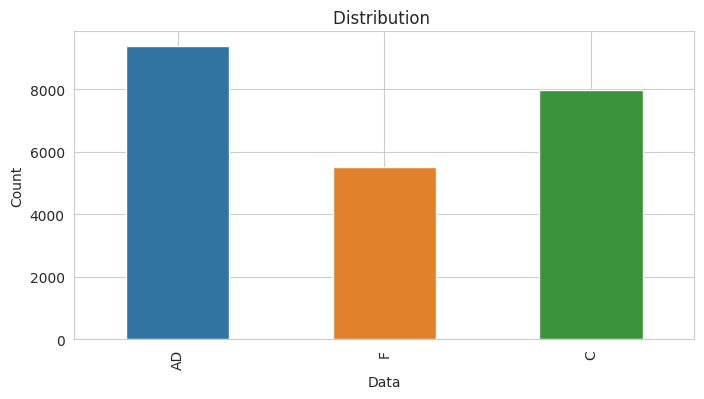

In [26]:
plt.figure(figsize=(8, 4)) 
sns.countplot(x = df["Label"],width=0.5,)
plt.title("Distribution ")
plt.xlabel('Data')
plt.ylabel('Count')
plt.xticks(rotation=90)  
plt.grid(True) 
plt.show()

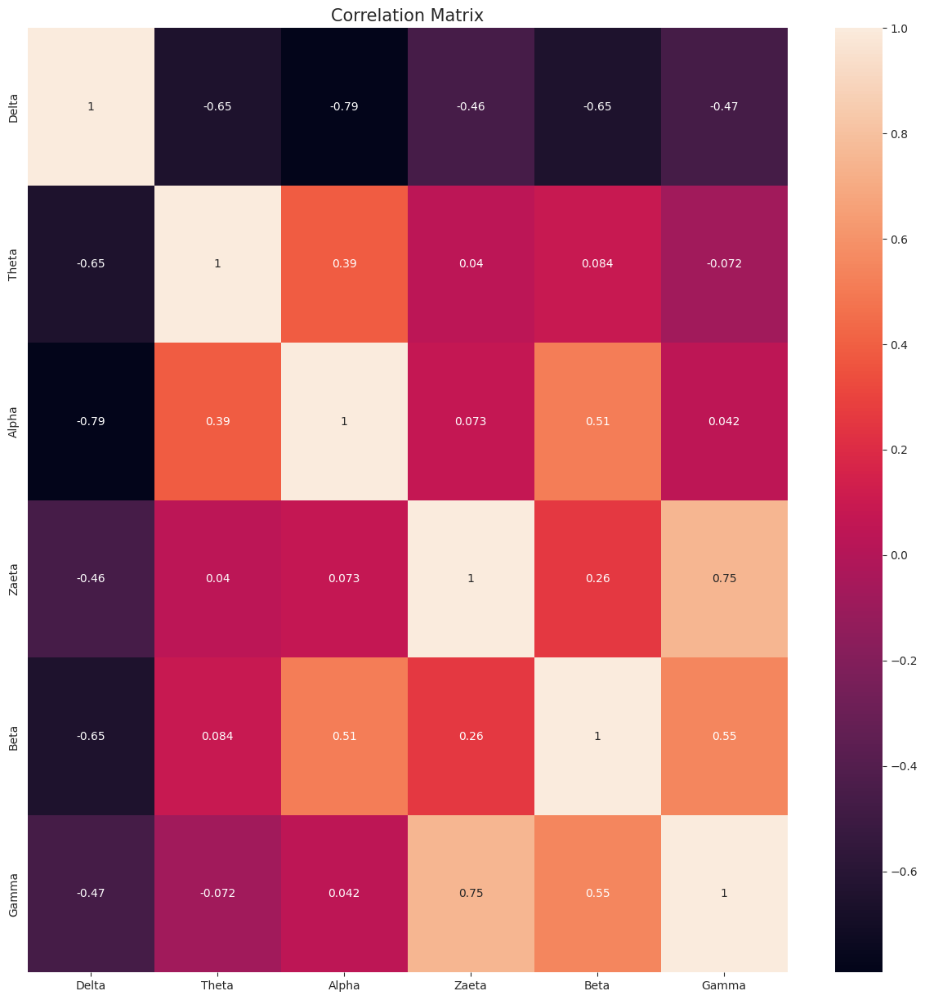

In [27]:
numeric_data = df.select_dtypes(include='number')
correlation_matrix = numeric_data.corr()
plt.figure(figsize=(15,15))
sns.heatmap(correlation_matrix, annot=True)
plt.gca().xaxis.tick_bottom()
plt.title("Correlation Matrix", fontsize=15)
plt.show()

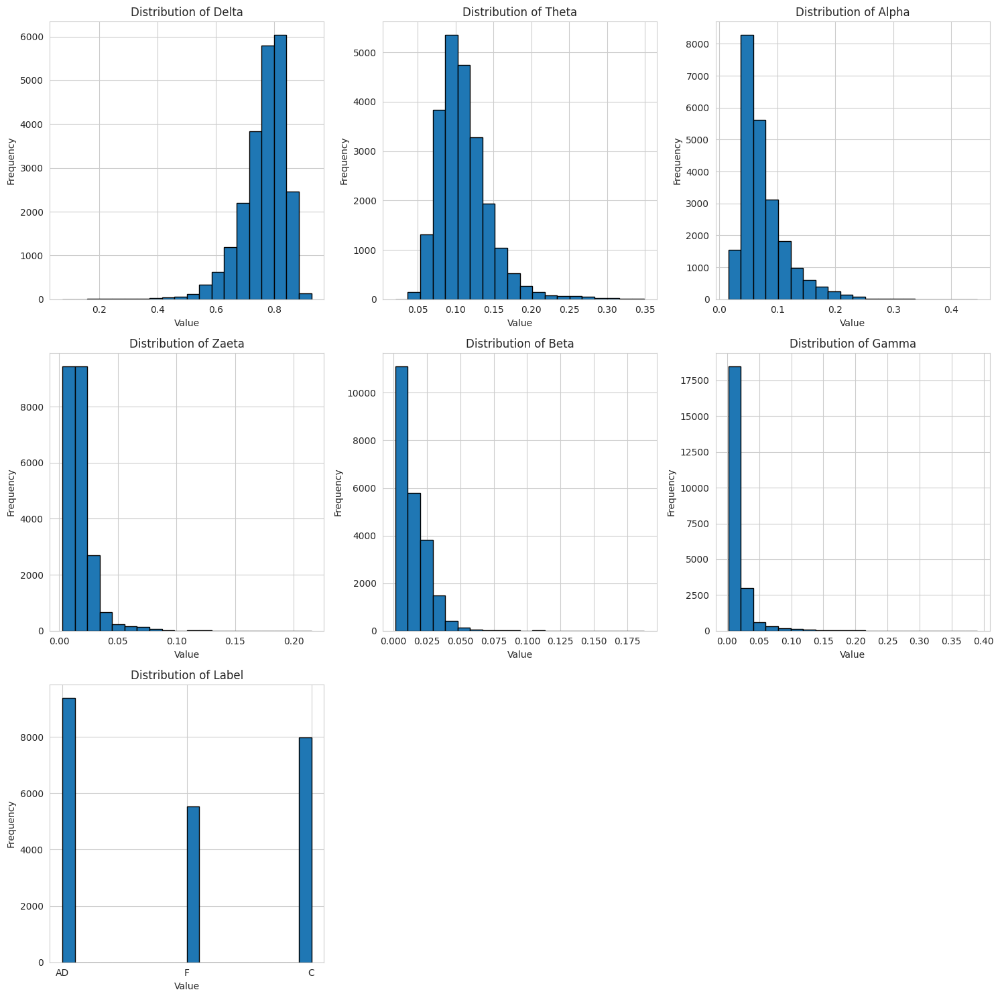

In [28]:
def plot_all_distributions(df, num_bins=20):
    """
    Plots the distribution histograms for all columns in the DataFrame.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.
    - num_bins (int): Number of bins for the histograms.
    """
    def distribution(ax, df, col, num_bins):
        ax.hist(df[col].dropna(), num_bins, edgecolor='black')
        ax.set_title(f'Distribution of {col}')
        ax.set_xlabel('Value')
        ax.set_ylabel('Frequency')

    cols = df.columns
    num_cols = len(cols)
    num_rows = (num_cols + 2) // 3  # 3 plots per row

    fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
    axes = axes.flatten()

    for i, col in enumerate(cols):
        distribution(axes[i], df, col, num_bins)

    # Hide unused subplots
    for j in range(len(cols), len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()


plot_all_distributions(df)

In [29]:
label_columns = "Label"
feature_columns = list(df.columns)
feature_columns.remove(label_columns)
X = df[feature_columns]
y = df[label_columns]

In [30]:
cls_label_encoder = LabelEncoder()
y = cls_label_encoder.fit_transform(y)
unique_values = cls_label_encoder.classes_
print("Unique encoded values:", unique_values)

Unique encoded values: ['AD' 'C' 'F']


In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True,stratify=y)

In [32]:
scaler = MinMaxScaler(feature_range=(0,1))
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [33]:
n_classes = len(np.unique(y))
y_train = to_categorical(y_train, num_classes=n_classes)
y_test = to_categorical(y_test, num_classes=n_classes)
input_shape = X_train.shape[1:]
print(input_shape)

(6, 1)


In [34]:
from keras.optimizers import Adam
def residual_block(x, filters, kernel_size, dilation_rate, dropout_rate):
    # First Convolution
    conv1 = layers.Conv1D(filters, kernel_size, padding='causal', dilation_rate=dilation_rate)(x)
    norm1 = layers.BatchNormalization()(conv1)
    act1 = layers.Activation('relu')(norm1)
    drop1 = layers.SpatialDropout1D(dropout_rate)(act1)

    # Second Convolution
    conv2 = layers.Conv1D(filters, kernel_size, padding='causal', dilation_rate=dilation_rate)(drop1)
    norm2 = layers.BatchNormalization()(conv2)
    act2 = layers.Activation('relu')(norm2)
    drop2 = layers.SpatialDropout1D(dropout_rate)(act2)

    # Residual Connection
    res = layers.Conv1D(filters, 1, padding='same')(x)
    res = layers.Add()([res, drop2])

    return res

# Direct Model Building with Best Hyperparameters
def build_best_model():
    input_shape = (6, 1)  # Example input shape
    inputs = Input(shape=input_shape)
    x = inputs

    # Best TCN Hyperparameters
    tcn_blocks = 2
    tcn_filters = 32
    tcn_kernel_size = 7
    tcn_dropout_rate = 0.3
    dilation_rate = 1

    # TCN Blocks
    for _ in range(tcn_blocks):
        x = residual_block(x, tcn_filters, tcn_kernel_size, dilation_rate, tcn_dropout_rate)
        dilation_rate *= 2  # Exponentially increase dilation rate

    # Best LSTM Hyperparameters
    num_lstm_layers = 1
    lstm_units = 64

    # Add LSTM Layers
    for i in range(num_lstm_layers):
        return_sequences = i < (num_lstm_layers - 1)  # Return sequences for all but the last LSTM layer
        x = LSTM(lstm_units, return_sequences=return_sequences)(x)

    # Best MLP Hyperparameters
    mlp_layers = [
        {"units": 128, "dropout": 0.2},
        {"units": 192, "dropout": 0.2},
        {"units": 256, "dropout": 0.2},
    ]
    for layer in mlp_layers:
        x = Dense(layer["units"], activation="relu")(x)
        x = Dropout(layer["dropout"])(x)

    # Output Layer
    output_size = 3  # Adjust based on your classification task
    outputs = Dense(output_size, activation="softmax")(x)

    model = Model(inputs, outputs)

    
    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

    return model

# Build and Train the Model
model = build_best_model()
model.summary()


I0000 00:00:1748071782.449441      93 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1748071782.450218      93 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 6, 1)           │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d (Conv1D)           │ (None, 6, 32)          │            256 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 6, 32)          │            128 │ conv1d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 6, 32)          │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d         │ (None, 6, 32)          │              0 │ activation[0][0]       │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_1 (Conv1D)         │ (None, 6, 32)          │          7,200 │ spatial_dropout1d[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 6, 32)          │            128 │ conv1d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 6, 32)          │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 6, 32)          │             64 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_1       │ (None, 6, 32)          │              0 │ activation_1[0][0]     │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 6, 32)          │              0 │ conv1d_2[0][0],        │
│                           │                        │                │ spatial_dropout1d_1[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_3 (Conv1D)         │ (None, 6, 32)          │          7,200 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 6, 32)          │            128 │ conv1d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 6, 32)          │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_2       │ (None, 6, 32)          │              0 │ activation_2[0][0]     │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_4 (Conv1D)         │ (None, 6, 32)          │          7,200 │ spatial_dropout1d_2[0… │
├──────────────────────

 Total params: 131,587 (514.01 KB)

 Trainable params: 131,331 (513.01 KB)

 Non-trainable params: 256 (1.00 KB)

In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)
fold = 1
val_accuracies = []

for train_idx, val_idx in kf.split(X_train):
    print(f"\n--- Fold {fold} ---")

    X_fold_train, X_fold_val = X_train[train_idx], X_train[val_idx]
    y_fold_train, y_fold_val = y_train[train_idx], y_train[val_idx]

    

    early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

    history = model.fit(
        X_fold_train, y_fold_train,
        validation_data=(X_fold_val, y_fold_val),
        epochs=300,
        batch_size=32,
        callbacks=[early_stop],
        verbose=1
    )

    val_loss, val_acc = model.evaluate(X_test, y_test, verbose=0)
    val_accuracies.append(val_acc)
    print(f"Fold {fold} Validation Accuracy: {val_acc:.4f}")
    fold += 1

print(f"\nAverage Validation Accuracy across 5 folds: {np.mean(val_accuracies):.4f}")



--- Fold 1 ---
Epoch 1/300


I0000 00:00:1748071887.168824     158 cuda_dnn.cc:529] Loaded cuDNN version 90300


458/458 ━━━━━━━━━━━━━━━━━━━━ 19s 14ms/step - accuracy: 0.4140 - loss: 1.0780 - val_accuracy: 0.4267 - val_loss: 1.0721
Epoch 2/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4772 - loss: 1.0455 - val_accuracy: 0.6792 - val_loss: 0.7239
Epoch 3/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6254 - loss: 0.7980 - val_accuracy: 0.7483 - val_loss: 0.4793
Epoch 4/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7164 - loss: 0.5769 - val_accuracy: 0.7611 - val_loss: 0.4434
Epoch 5/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7293 - loss: 0.5121 - val_accuracy: 0.7611 - val_loss: 0.4405
Epoch 6/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.7407 - loss: 0.4762 - val_accuracy: 0.7614 - val_loss: 0.4348
Epoch 7/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7425 - loss: 0.4786 - val_accuracy: 0.7679 - val_loss: 0.4344
Epoch 8/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7440 - loss: 0.4608 - val_accurac

In [37]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)
fold = 1
val_accuracies = []

for train_idx, val_idx in kf.split(X_train):
    print(f"\n--- Fold {fold} ---")

    X_fold_train, X_fold_val = X_train[train_idx], X_train[val_idx]
    y_fold_train, y_fold_val = y_train[train_idx], y_train[val_idx]

    

    early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

    history = model.fit(
        X_fold_train, y_fold_train,
        validation_data=(X_fold_val, y_fold_val),
        epochs=300,
        batch_size=32,
        callbacks=[early_stop],
        verbose=1
    )

    val_loss, val_acc = model.evaluate(X_test, y_test, verbose=0)
    val_accuracies.append(val_acc)
    print(f"Fold {fold} Validation Accuracy: {val_acc:.4f}")
    fold += 1

print(f"\nAverage Validation Accuracy across 5 folds: {np.mean(val_accuracies):.4f}")



--- Fold 1 ---
Epoch 1/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7972 - loss: 0.3824 - val_accuracy: 0.8021 - val_loss: 0.3712
Epoch 2/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.7994 - loss: 0.3807 - val_accuracy: 0.8037 - val_loss: 0.3737
Epoch 3/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8004 - loss: 0.3838 - val_accuracy: 0.8054 - val_loss: 0.3729
Epoch 4/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7993 - loss: 0.3795 - val_accuracy: 0.8032 - val_loss: 0.3739
Epoch 5/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7972 - loss: 0.3837 - val_accuracy: 0.8021 - val_loss: 0.3713
Epoch 6/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8028 - loss: 0.3782 - val_accuracy: 0.8007 - val_loss: 0.3746
Epoch 7/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8007 - loss: 0.3795 - val_accuracy: 0.8018 - val_loss: 0.3747
Epoch 8/300
458/458 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.8020 -

144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
144/144 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8059 - loss: 0.3709

Test Loss: 0.3790
Test Accuracy: 0.7997

Accuracy: 0.7997
Precision (macro avg): 0.8015
Recall (macro avg): 0.7410
F1 Score (macro avg): 0.7369


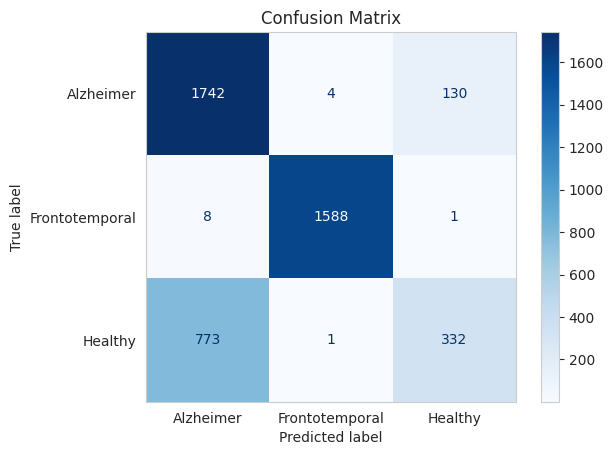


Class: Alzheimer
Sensitivity (Recall): 0.93
Specificity: 0.71

Class: Frontotemporal
Sensitivity (Recall): 0.99
Specificity: 1.00

Class: Healthy
Sensitivity (Recall): 0.30
Specificity: 0.96

Classification Report:
                precision    recall  f1-score   support

     Alzheimer       0.69      0.93      0.79      1876
Frontotemporal       1.00      0.99      1.00      1597
       Healthy       0.72      0.30      0.42      1106

      accuracy                           0.80      4579
     macro avg       0.80      0.74      0.74      4579
  weighted avg       0.80      0.80      0.77      4579



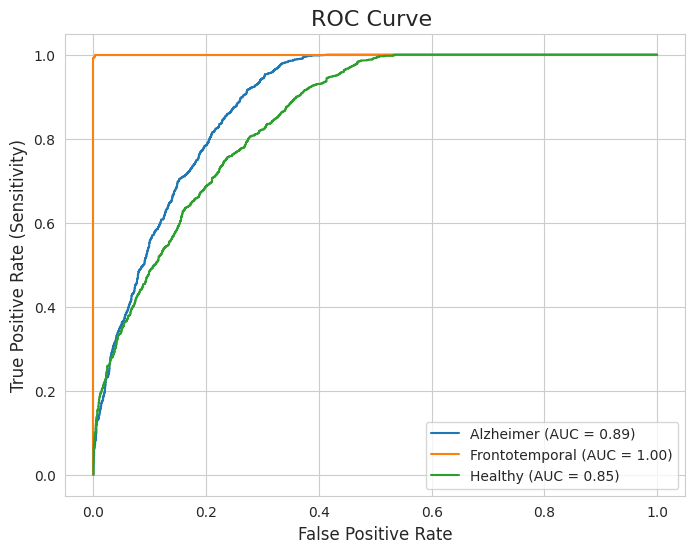

In [36]:
# --- Predict on Test Data ---
y_pred_prob = model.predict(X_test)
y_pred_classes = np.argmax(y_pred_prob, axis=1)

# Convert y_test to class labels if it's one-hot encoded
y_test_classes = (
    np.argmax(y_test, axis=1)
    if len(y_test.shape) > 1 and y_test.shape[1] > 1
    else y_test
)

# --- Evaluate Model ---
val_loss, val_accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"\nTest Loss: {val_loss:.4f}")
print(f"Test Accuracy: {val_accuracy:.4f}")

# --- Classification Metrics ---
accuracy = accuracy_score(y_test_classes, y_pred_classes)
precision = precision_score(y_test_classes, y_pred_classes, average='macro')
recall = recall_score(y_test_classes, y_pred_classes, average='macro')
f1 = f1_score(y_test_classes, y_pred_classes, average='macro')

print(f"\nAccuracy: {accuracy:.4f}")
print(f"Precision (macro avg): {precision:.4f}")
print(f"Recall (macro avg): {recall:.4f}")
print(f"F1 Score (macro avg): {f1:.4f}")

# --- Confusion Matrix ---
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)
class_names = ["Alzheimer", "Frontotemporal", "Healthy"]

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

# --- Sensitivity and Specificity per Class ---
sensitivity = {}
specificity = {}

for i, class_name in enumerate(class_names):
    TP = conf_matrix[i, i]
    FN = conf_matrix[i, :].sum() - TP
    FP = conf_matrix[:, i].sum() - TP
    TN = conf_matrix.sum() - (TP + FP + FN)
    
    sensitivity[class_name] = TP / (TP + FN) if (TP + FN) != 0 else 0.0
    specificity[class_name] = TN / (TN + FP) if (TN + FP) != 0 else 0.0

    print(f"\nClass: {class_name}")
    print(f"Sensitivity (Recall): {sensitivity[class_name]:.2f}")
    print(f"Specificity: {specificity[class_name]:.2f}")

# --- Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test_classes, y_pred_classes, target_names=class_names))

# --- ROC Curve (One-vs-Rest) ---
fpr, tpr, roc_auc = {}, {}, {}

for i in range(len(class_names)):
    y_true_binary = (y_test_classes == i).astype(int)
    fpr[i], tpr[i], _ = roc_curve(y_true_binary, y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# --- Plot ROC Curves ---
plt.figure(figsize=(8, 6))
for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.title('ROC Curve ', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# **Proposed Model**

In [93]:
input_shape = (6, 1)  
inputs = Input(shape=input_shape)
x = inputs


tcn_blocks = 2
tcn_filters = 32
tcn_kernel_size = 7
tcn_dropout_rate = 0.3
dilation_rate = 1

for _ in range(tcn_blocks):
    # First conv layer
    conv1 = layers.Conv1D(tcn_filters, tcn_kernel_size, padding='causal', dilation_rate=dilation_rate)(x)
    norm1 = layers.BatchNormalization()(conv1)
    act1 = layers.Activation('relu')(norm1)
    drop1 = layers.SpatialDropout1D(tcn_dropout_rate)(act1)

    # Second conv layer
    conv2 = layers.Conv1D(tcn_filters, tcn_kernel_size, padding='causal', dilation_rate=dilation_rate)(drop1)
    norm2 = layers.BatchNormalization()(conv2)
    act2 = layers.Activation('relu')(norm2)
    drop2 = layers.SpatialDropout1D(tcn_dropout_rate)(act2)

    # Residual connection
    shortcut = layers.Conv1D(tcn_filters, 1, padding='same')(x)
    x = layers.Add()([shortcut, drop2])

    # Update dilation rate
    dilation_rate *= 2


lstm_units = 64
x = LSTM(lstm_units, return_sequences=False)(x)


x = Dense(128, activation="relu")(x)
x = Dropout(0.2)(x)

x = Dense(192, activation="relu")(x)
x = Dropout(0.2)(x)

x = Dense(256, activation="relu")(x)
x = Dropout(0.2)(x)


output_size = 3  
outputs = Dense(output_size, activation="softmax")(x)

model = Model(inputs=inputs, outputs=outputs)
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)


model.summary()


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 6, 1)           │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_30 (Conv1D)        │ (None, 6, 32)          │            256 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_20    │ (None, 6, 32)          │            128 │ conv1d_30[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_20             │ (None, 6, 32)          │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_20      │ (None, 6, 32)          │              0 │ activation_20[0][0]    │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_31 (Conv1D)        │ (None, 6, 32)          │          7,200 │ spatial_dropout1d_20[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_21    │ (None, 6, 32)          │            128 │ conv1d_31[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_21             │ (None, 6, 32)          │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_32 (Conv1D)        │ (None, 6, 32)          │             64 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_21      │ (None, 6, 32)          │              0 │ activation_21[0][0]    │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_10 (Add)              │ (None, 6, 32)          │              0 │ conv1d_32[0][0],       │
│                           │                        │                │ spatial_dropout1d_21[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_33 (Conv1D)        │ (None, 6, 32)          │          7,200 │ add_10[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_22    │ (None, 6, 32)          │            128 │ conv1d_33[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_22             │ (None, 6, 32)          │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_22 

 Total params: 131,587 (514.01 KB)

 Trainable params: 131,331 (513.01 KB)

 Non-trainable params: 256 (1.00 KB)

# **Model Training**

In [35]:
import time

# Early stopping to prevent overfitting
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
start_time = time.time()
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=250,
    batch_size=32,
    callbacks=[early_stop],
    verbose=1
)

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time:.2f} seconds")

Epoch 1/250


I0000 00:00:1747896941.554278     167 cuda_dnn.cc:529] Loaded cuDNN version 90300


458/458 ━━━━━━━━━━━━━━━━━━━━ 18s 14ms/step - accuracy: 0.3918 - loss: 1.0819 - val_accuracy: 0.3492 - val_loss: 1.0674
Epoch 2/250
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5043 - loss: 1.0061 - val_accuracy: 0.7259 - val_loss: 0.5833
Epoch 3/250
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6774 - loss: 0.6904 - val_accuracy: 0.7458 - val_loss: 0.4626
Epoch 4/250
458/458 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7266 - loss: 0.5371 - val_accuracy: 0.7518 - val_loss: 0.4422
Epoch 5/250
458/458 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.7423 - loss: 0.4930 - val_accuracy: 0.7532 - val_loss: 0.4403
Epoch 6/250
458/458 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.7438 - loss: 0.4785 - val_accuracy: 0.7532 - val_loss: 0.4366
Epoch 7/250
458/458 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.7458 - loss: 0.4688 - val_accuracy: 0.7532 - val_loss: 0.4343
Epoch 8/250
458/458 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.7498 - loss: 0.4614 - val_accurac

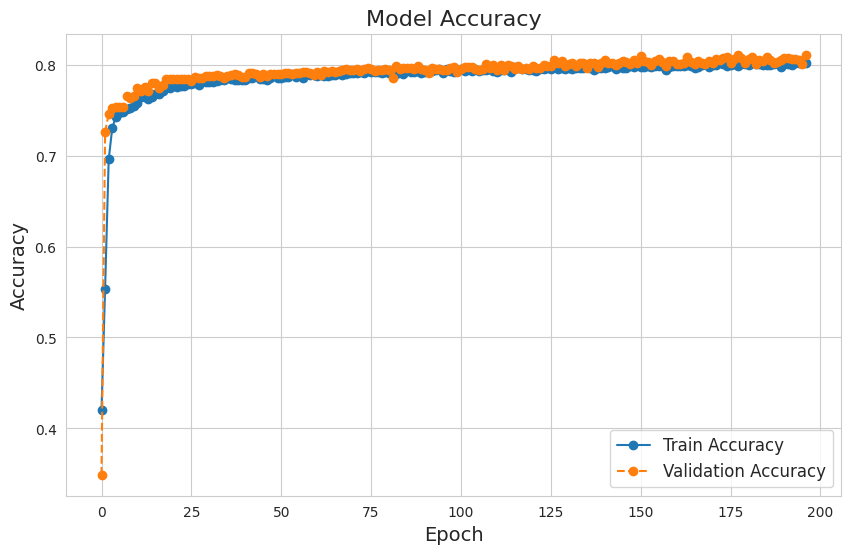

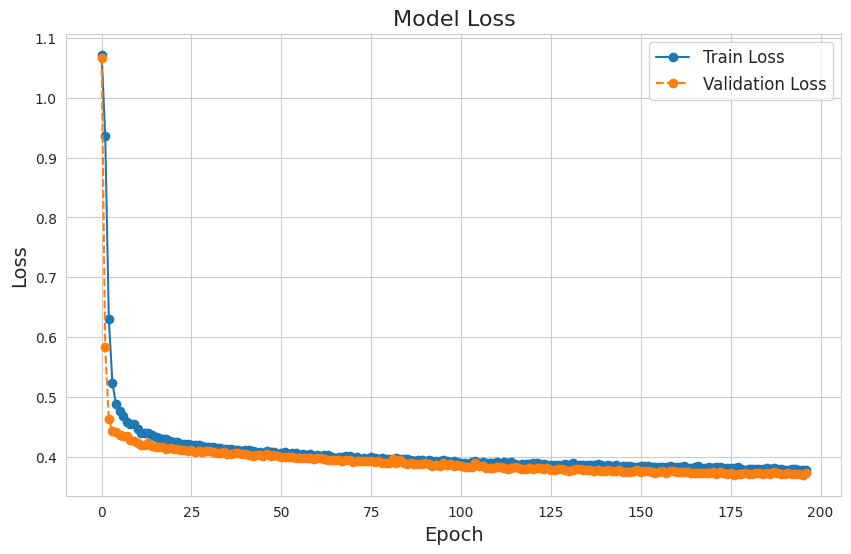

In [36]:
num_classes = 3
# Plot training history
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o', linestyle='-')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o', linestyle='--')
plt.title("Model Accuracy", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss', marker='o', linestyle='-')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o', linestyle='--')
plt.title("Model Loss", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Loss", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()


# **Model Evaluation Multi**

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
144/144 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7997 - loss: 0.3807

Test Loss: 0.3769
Test Accuracy: 0.8026

Accuracy: 0.8026
Precision (macro avg): 0.7904
Recall (macro avg): 0.7541
F1 Score (macro avg): 0.7557


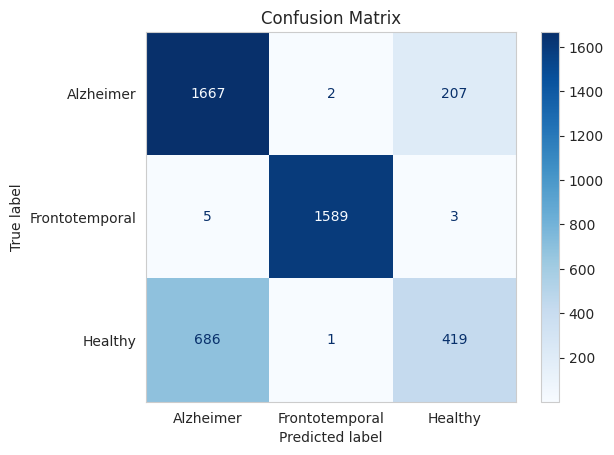


Class: Alzheimer
Sensitivity (Recall): 0.89
Specificity: 0.74

Class: Frontotemporal
Sensitivity (Recall): 0.99
Specificity: 1.00

Class: Healthy
Sensitivity (Recall): 0.38
Specificity: 0.94

Classification Report:
                precision    recall  f1-score   support

     Alzheimer       0.71      0.89      0.79      1876
Frontotemporal       1.00      0.99      1.00      1597
       Healthy       0.67      0.38      0.48      1106

      accuracy                           0.80      4579
     macro avg       0.79      0.75      0.76      4579
  weighted avg       0.80      0.80      0.79      4579



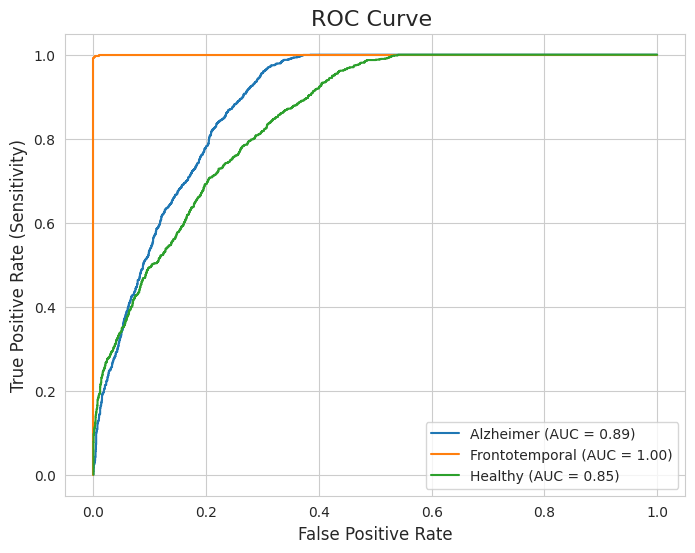

In [37]:
# --- Predict on Test Data ---
y_pred_prob = model.predict(X_test)
y_pred_classes = np.argmax(y_pred_prob, axis=1)

# Convert y_test to class labels if it's one-hot encoded
y_test_classes = (
    np.argmax(y_test, axis=1)
    if len(y_test.shape) > 1 and y_test.shape[1] > 1
    else y_test
)

# --- Evaluate Model ---
val_loss, val_accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"\nTest Loss: {val_loss:.4f}")
print(f"Test Accuracy: {val_accuracy:.4f}")

# --- Classification Metrics ---
accuracy = accuracy_score(y_test_classes, y_pred_classes)
precision = precision_score(y_test_classes, y_pred_classes, average='macro')
recall = recall_score(y_test_classes, y_pred_classes, average='macro')
f1 = f1_score(y_test_classes, y_pred_classes, average='macro')

print(f"\nAccuracy: {accuracy:.4f}")
print(f"Precision (macro avg): {precision:.4f}")
print(f"Recall (macro avg): {recall:.4f}")
print(f"F1 Score (macro avg): {f1:.4f}")

# --- Confusion Matrix ---
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)
class_names = ["Alzheimer", "Frontotemporal", "Healthy"]

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

# --- Sensitivity and Specificity per Class ---
sensitivity = {}
specificity = {}

for i, class_name in enumerate(class_names):
    TP = conf_matrix[i, i]
    FN = conf_matrix[i, :].sum() - TP
    FP = conf_matrix[:, i].sum() - TP
    TN = conf_matrix.sum() - (TP + FP + FN)
    
    sensitivity[class_name] = TP / (TP + FN) if (TP + FN) != 0 else 0.0
    specificity[class_name] = TN / (TN + FP) if (TN + FP) != 0 else 0.0

    print(f"\nClass: {class_name}")
    print(f"Sensitivity (Recall): {sensitivity[class_name]:.2f}")
    print(f"Specificity: {specificity[class_name]:.2f}")

# --- Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test_classes, y_pred_classes, target_names=class_names))

# --- ROC Curve (One-vs-Rest) ---
fpr, tpr, roc_auc = {}, {}, {}

for i in range(len(class_names)):
    y_true_binary = (y_test_classes == i).astype(int)
    fpr[i], tpr[i], _ = roc_curve(y_true_binary, y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# --- Plot ROC Curves ---
plt.figure(figsize=(8, 6))
for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.title('ROC Curve ', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

K Flod Validation

# **XAI**

ExactExplainer explainer: 4580it [06:30, 11.54it/s]                          


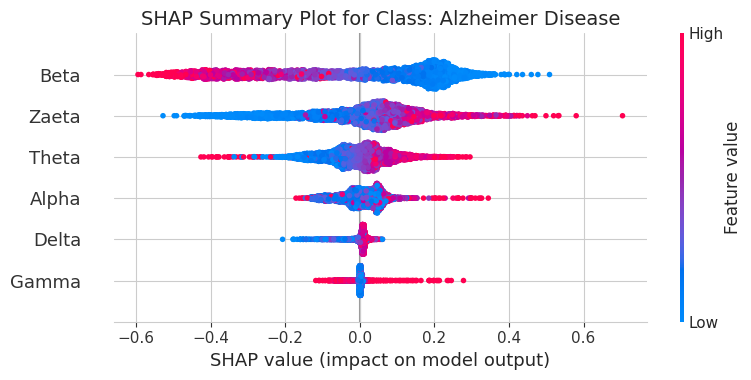

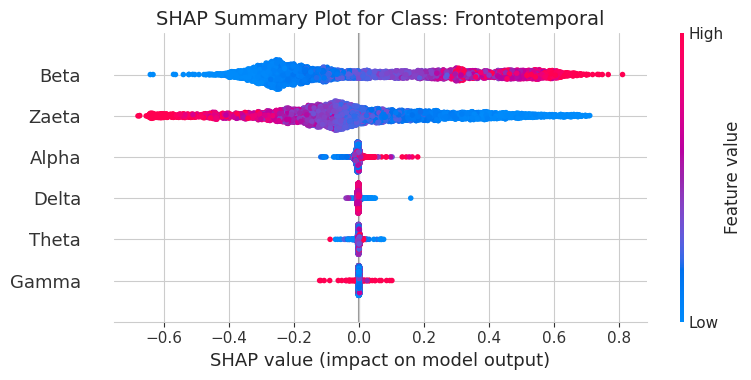

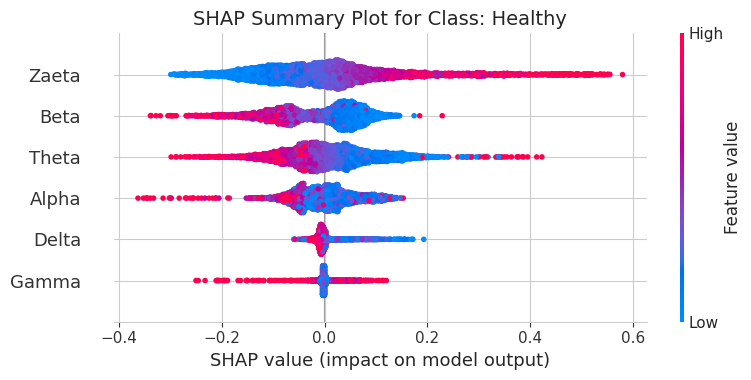

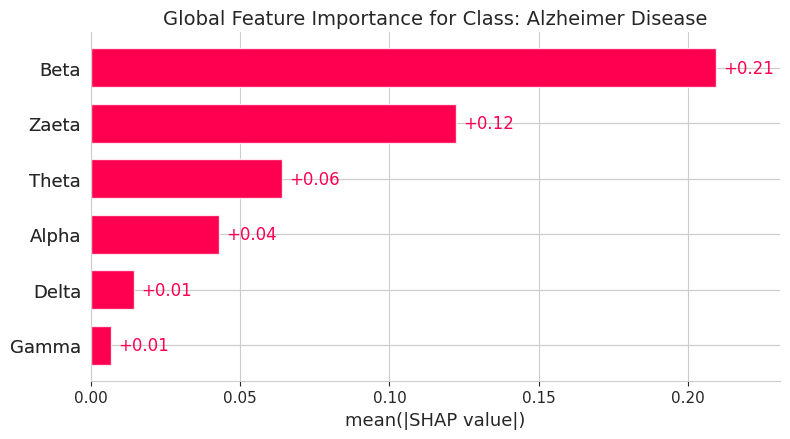

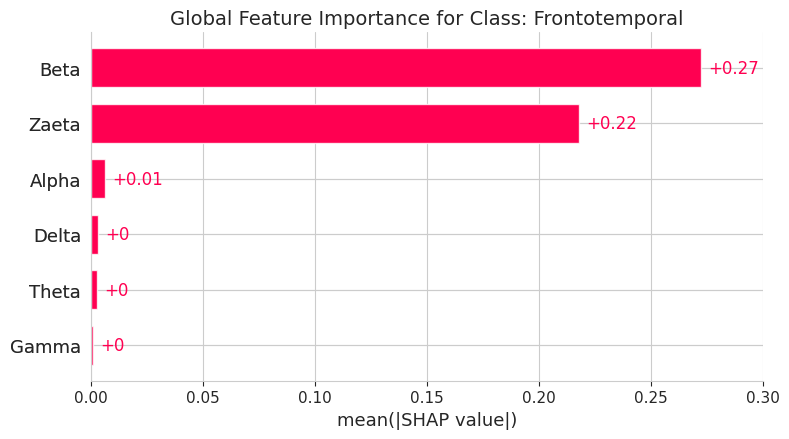

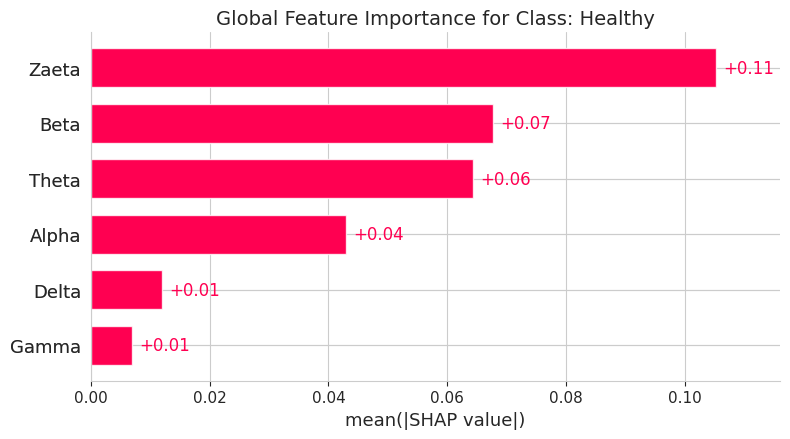

<Figure size 1000x600 with 0 Axes>

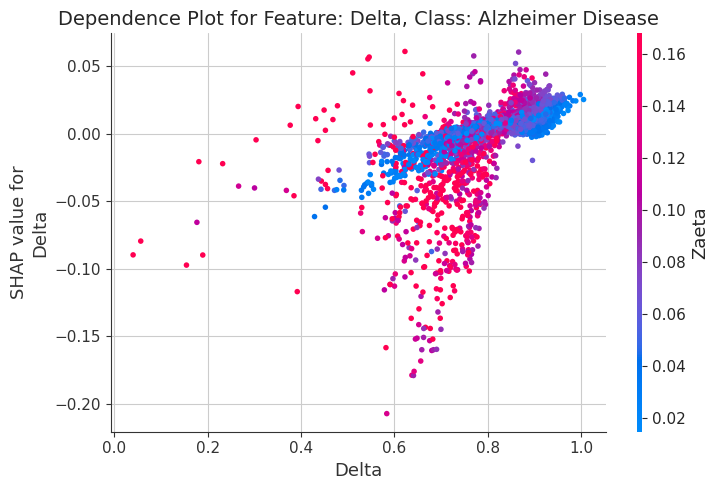

<Figure size 1000x600 with 0 Axes>

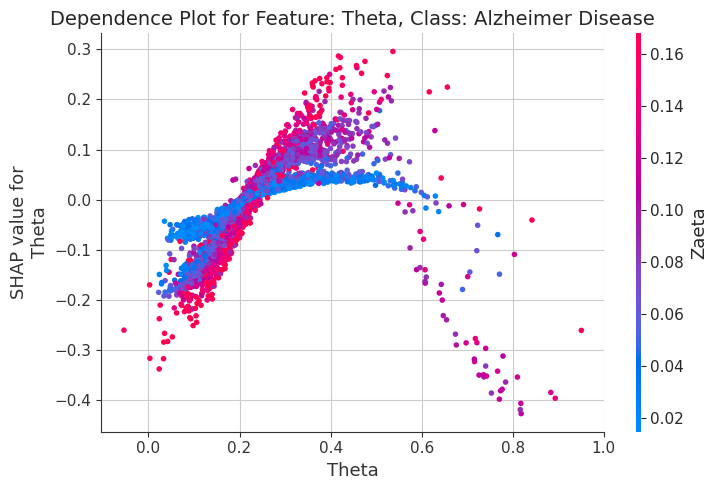

<Figure size 1000x600 with 0 Axes>

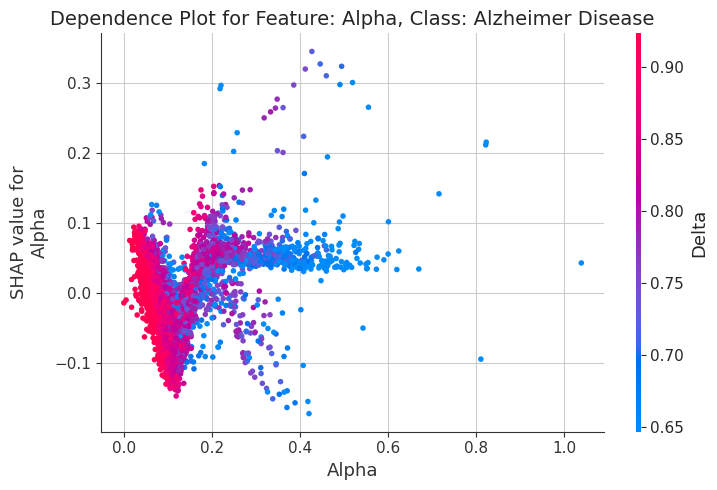

<Figure size 1000x600 with 0 Axes>

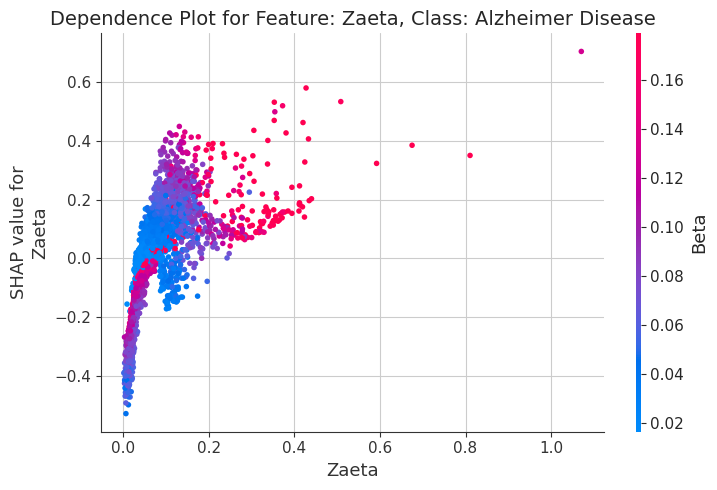

<Figure size 1000x600 with 0 Axes>

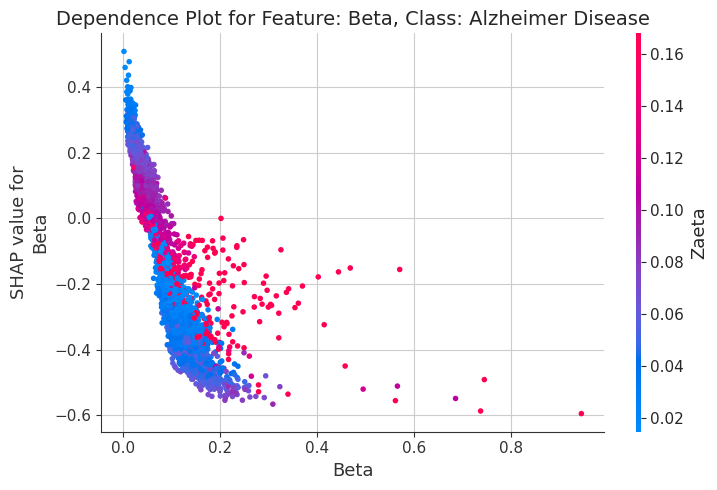

<Figure size 1000x600 with 0 Axes>

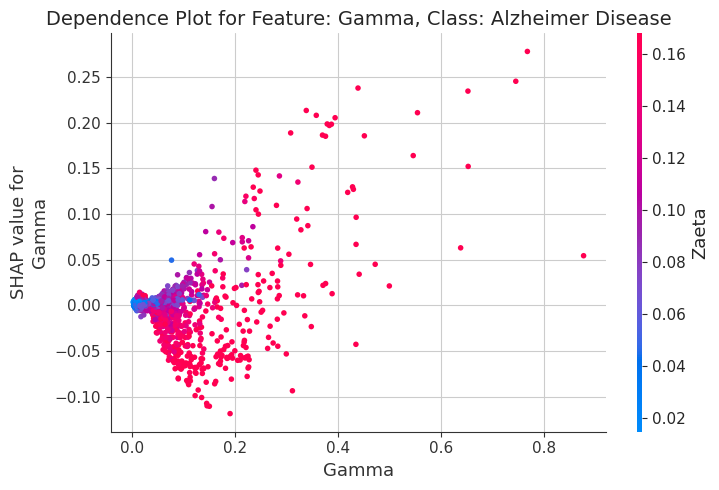

<Figure size 1000x600 with 0 Axes>

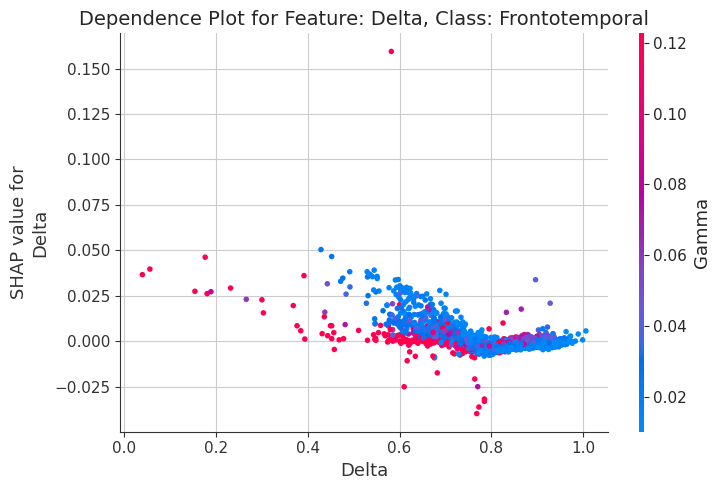

<Figure size 1000x600 with 0 Axes>

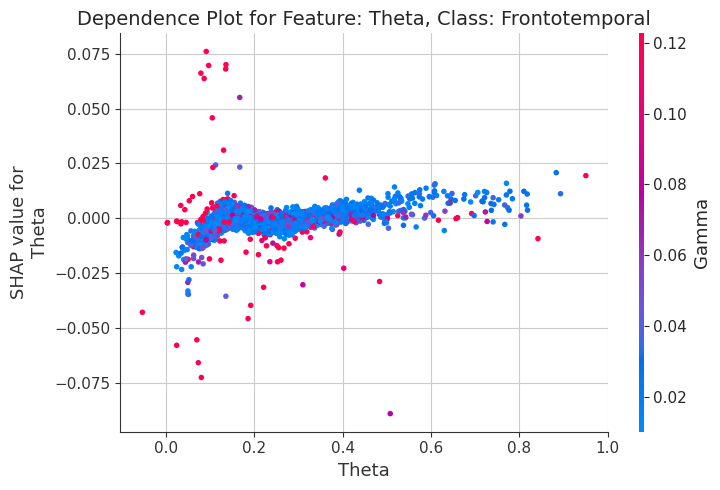

<Figure size 1000x600 with 0 Axes>

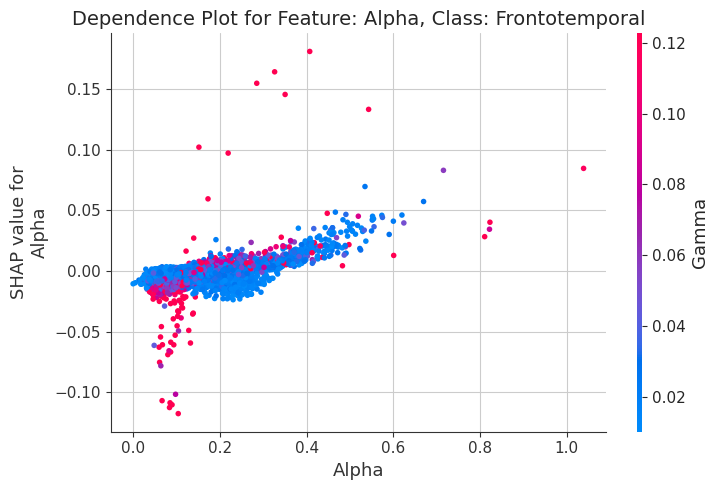

<Figure size 1000x600 with 0 Axes>

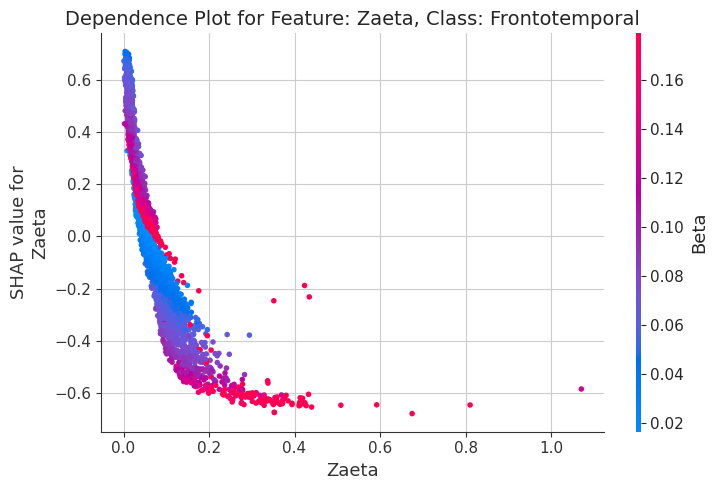

<Figure size 1000x600 with 0 Axes>

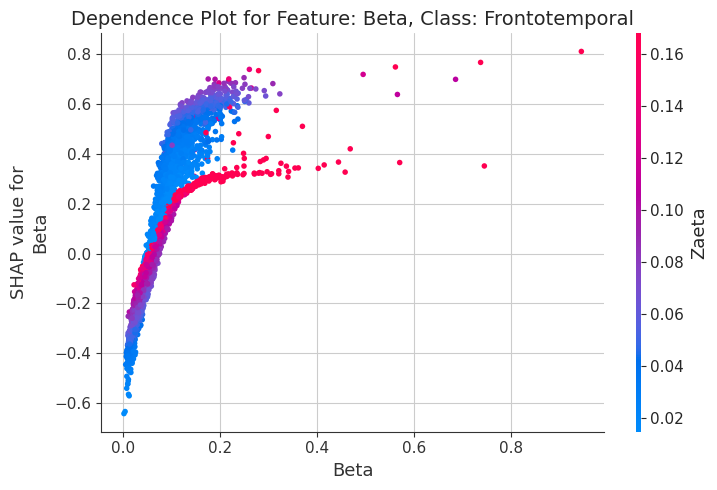

<Figure size 1000x600 with 0 Axes>

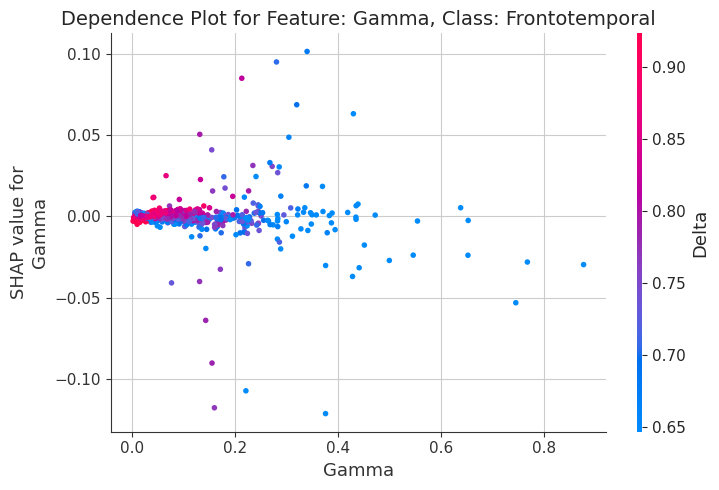

<Figure size 1000x600 with 0 Axes>

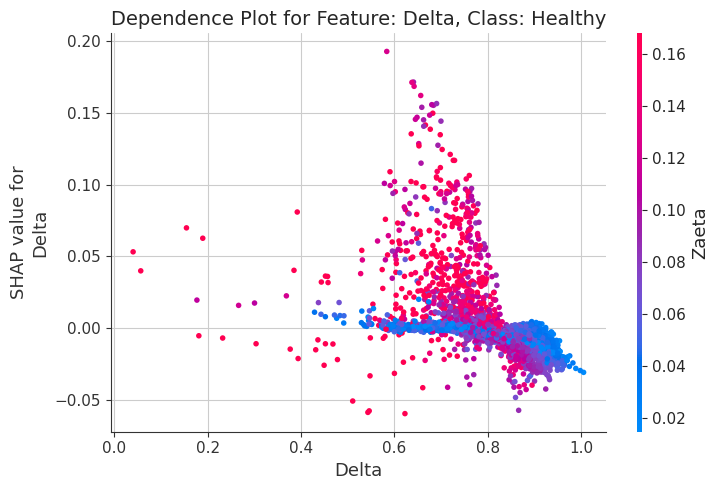

<Figure size 1000x600 with 0 Axes>

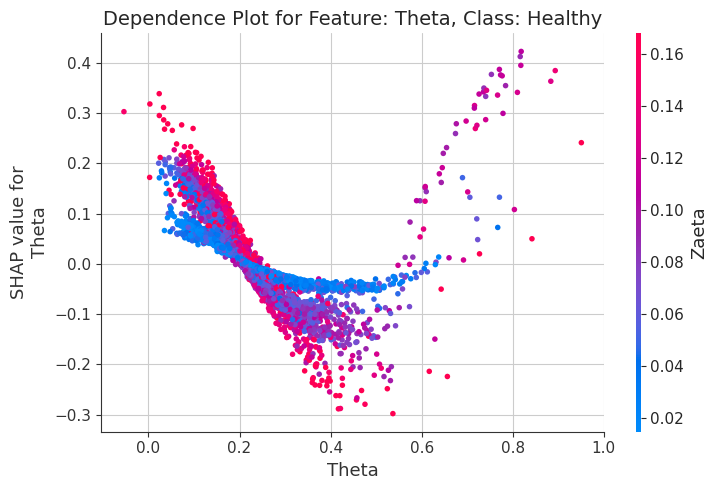

<Figure size 1000x600 with 0 Axes>

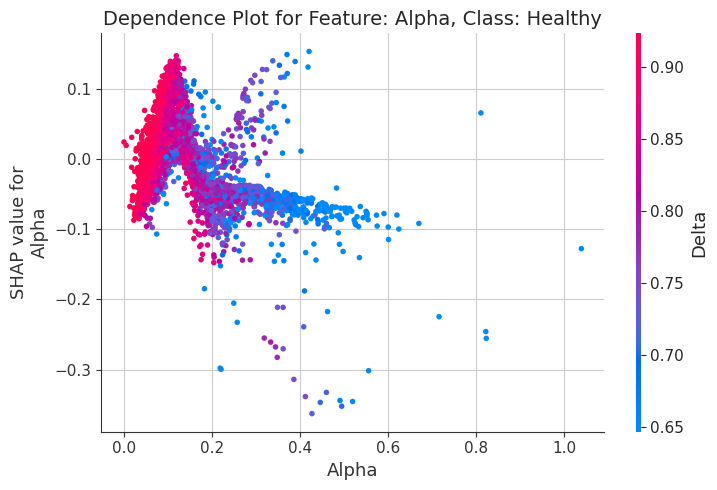

<Figure size 1000x600 with 0 Axes>

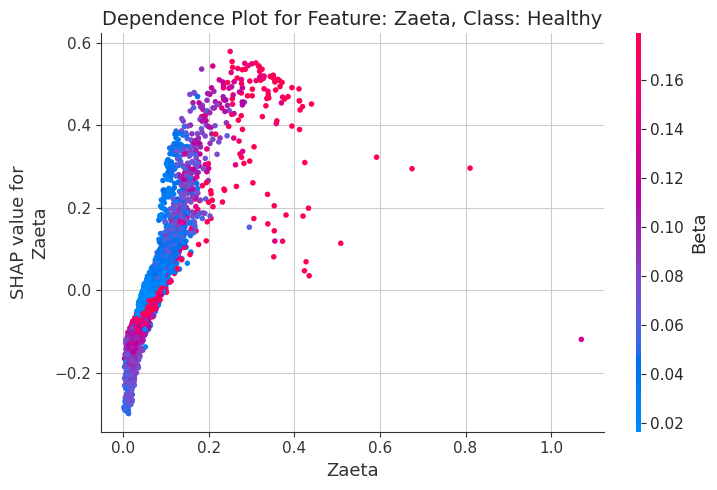

<Figure size 1000x600 with 0 Axes>

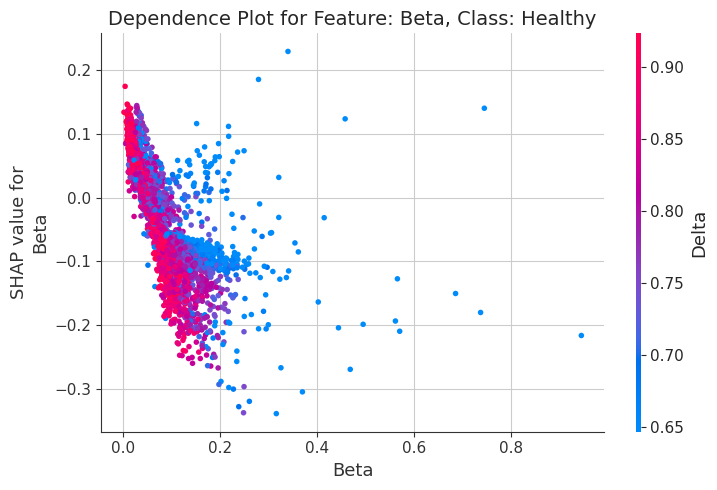

<Figure size 1000x600 with 0 Axes>

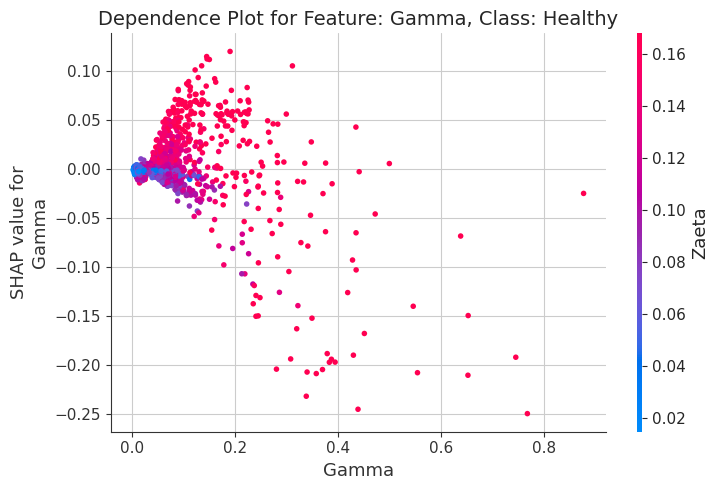

In [39]:
import shap
import pandas as pd
import matplotlib.pyplot as plt
X_test_reshaped = X_test.reshape(X_test.shape[0], -1)
X_train_reshaped = X_train.reshape(X_train.shape[0], -1)
feature_names = ["Delta", "Theta", "Alpha", "Zaeta", "Beta", "Gamma"]  
class_names = ["Alzheimer Disease","Frontotemporal", "Healthy"] 
X_train_df = pd.DataFrame(X_train_reshaped, columns=feature_names)
X_test_df = pd.DataFrame(X_test_reshaped, columns=feature_names)

explainer = shap.Explainer(model, X_train_df)

shap_values = explainer(X_test_df)
for selected_class in range(shap_values.values.shape[2]):  
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values.values[:, :, selected_class],  
        features=X_test_df,                       
        feature_names=feature_names,              
        show=False                                
    )
    plt.title(f"SHAP Summary Plot for Class: {class_names[selected_class]}", fontsize=14)
    plt.tight_layout()
    plt.show()

for selected_class in range(shap_values.values.shape[2]):  
    plt.figure(figsize=(10, 6))
    shap.plots.bar(
        shap_values[:, :, selected_class],  
        show=False                          
    )
    plt.title(f"Global Feature Importance for Class: {class_names[selected_class]}", fontsize=14)
    plt.tight_layout()
    plt.show()


for j in range(shap_values.values.shape[2]):  
    for feature in feature_names:
        plt.figure(figsize=(10, 6))
        shap.dependence_plot(
            feature,                          
            shap_values.values[:, :, j],      
            X_test_df,                        
            feature_names=feature_names,      
            show=False                        
        )
        plt.title(f"Dependence Plot for Feature: {feature}, Class: {class_names[j]}", fontsize=14)
        plt.tight_layout()
        plt.show()


In [ ]:

# Heatmap to visualize SHAP values across instances and features
for j in range(shap_values.values.shape[2]):  s
    plt.figure(figsize=(12, 8))
    shap.plots.heatmap(
        shap_values[:, :, j],  
        show=False  
    )
    plt.title(f"Heatmap for Class: {class_names[j]}", fontsize=14)
    plt.tight_layout()
    plt.show()

# **Data Balance**

In [38]:
counter = Counter(y)
print(counter)
oversample = SMOTE(random_state=42)
X, y = oversample.fit_resample(X, y)
counter = Counter(y)
print(counter)

Counter({0: 9380, 1: 7981, 2: 5530})
Counter({0: 9380, 2: 9380, 1: 9380})


In [39]:
cls_label_encoder = LabelEncoder()
y = cls_label_encoder.fit_transform(y)
unique_values = cls_label_encoder.classes_
print("Unique encoded values:", unique_values)

Unique encoded values: [0 1 2]


In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True,stratify=y)

In [41]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [42]:
n_classes = len(np.unique(y))
y_train = to_categorical(y_train, num_classes=n_classes)
y_test = to_categorical(y_test, num_classes=n_classes)
input_shape = X_train.shape[1:]
print(input_shape)

(6, 1)


In [43]:
input_shape = (6, 1)  
inputs = Input(shape=input_shape)
x = inputs


tcn_blocks = 2
tcn_filters = 32
tcn_kernel_size = 7
tcn_dropout_rate = 0.3
dilation_rate = 1

for _ in range(tcn_blocks):
    # First conv layer
    conv1 = layers.Conv1D(tcn_filters, tcn_kernel_size, padding='causal', dilation_rate=dilation_rate)(x)
    norm1 = layers.BatchNormalization()(conv1)
    act1 = layers.Activation('relu')(norm1)
    drop1 = layers.SpatialDropout1D(tcn_dropout_rate)(act1)

    # Second conv layer
    conv2 = layers.Conv1D(tcn_filters, tcn_kernel_size, padding='causal', dilation_rate=dilation_rate)(drop1)
    norm2 = layers.BatchNormalization()(conv2)
    act2 = layers.Activation('relu')(norm2)
    drop2 = layers.SpatialDropout1D(tcn_dropout_rate)(act2)

    # Residual connection
    shortcut = layers.Conv1D(tcn_filters, 1, padding='same')(x)
    x = layers.Add()([shortcut, drop2])

    # Update dilation rate
    dilation_rate *= 2


lstm_units = 64
x = LSTM(lstm_units, return_sequences=False)(x)


x = Dense(128, activation="relu")(x)
x = Dropout(0.2)(x)

x = Dense(192, activation="relu")(x)
x = Dropout(0.2)(x)

x = Dense(256, activation="relu")(x)
x = Dropout(0.2)(x)


output_size = 3  
outputs = Dense(output_size, activation="softmax")(x)

model = Model(inputs=inputs, outputs=outputs)
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)


model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 6, 1)           │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_6 (Conv1D)         │ (None, 6, 32)          │            256 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 6, 32)          │            128 │ conv1d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activation) │ (None, 6, 32)          │              0 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_4       │ (None, 6, 32)          │              0 │ activation_4[0][0]     │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_7 (Conv1D)         │ (None, 6, 32)          │          7,200 │ spatial_dropout1d_4[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_5     │ (None, 6, 32)          │            128 │ conv1d_7[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_5 (Activation) │ (None, 6, 32)          │              0 │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_8 (Conv1D)         │ (None, 6, 32)          │             64 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_5       │ (None, 6, 32)          │              0 │ activation_5[0][0]     │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 6, 32)          │              0 │ conv1d_8[0][0],        │
│                           │                        │                │ spatial_dropout1d_5[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_9 (Conv1D)         │ (None, 6, 32)          │          7,200 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_6     │ (None, 6, 32)          │            128 │ conv1d_9[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_6 (Activation) │ (None, 6, 32)          │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_6       │ (None, 6, 32)          │              0 │ activation_6[0][0]     │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_10 (Conv1D)   

 Total params: 131,587 (514.01 KB)

 Trainable params: 131,331 (513.01 KB)

 Non-trainable params: 256 (1.00 KB)

In [45]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)
fold = 1
val_accuracies = []

for train_idx, val_idx in kf.split(X_train):
    print(f"\n--- Fold {fold} ---")

    X_fold_train, X_fold_val = X_train[train_idx], X_train[val_idx]
    y_fold_train, y_fold_val = y_train[train_idx], y_train[val_idx]

    

    early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

    history = model.fit(
        X_fold_train, y_fold_train,
        validation_data=(X_fold_val, y_fold_val),
        epochs=300,
        batch_size=32,
        callbacks=[early_stop],
        verbose=1
    )

    val_loss, val_acc = model.evaluate(X_test, y_test, verbose=0)
    val_accuracies.append(val_acc)
    print(f"Fold {fold} Validation Accuracy: {val_acc:.4f}")
    fold += 1

print(f"\nAverage Validation Accuracy across 5 folds: {np.mean(val_accuracies):.4f}")



--- Fold 1 ---
Epoch 1/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - accuracy: 0.7761 - loss: 0.3946 - val_accuracy: 0.7657 - val_loss: 0.4016
Epoch 2/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7846 - loss: 0.3862 - val_accuracy: 0.7628 - val_loss: 0.4027
Epoch 3/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7751 - loss: 0.3930 - val_accuracy: 0.7619 - val_loss: 0.4018
Epoch 4/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7754 - loss: 0.3923 - val_accuracy: 0.7653 - val_loss: 0.4036
Epoch 5/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - accuracy: 0.7762 - loss: 0.3941 - val_accuracy: 0.7642 - val_loss: 0.4047
Epoch 6/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7733 - loss: 0.3916 - val_accuracy: 0.7617 - val_loss: 0.4035
Epoch 7/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7738 - loss: 0.3963 - val_accuracy: 0.7644 - val_loss: 0.4075
Epoch 8/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7749 -

176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7790 - loss: 0.3864

Test Loss: 0.3904
Test Accuracy: 0.7745

Accuracy: 0.7745
Precision (macro avg): 0.7775
Recall (macro avg): 0.7745
F1 Score (macro avg): 0.7731


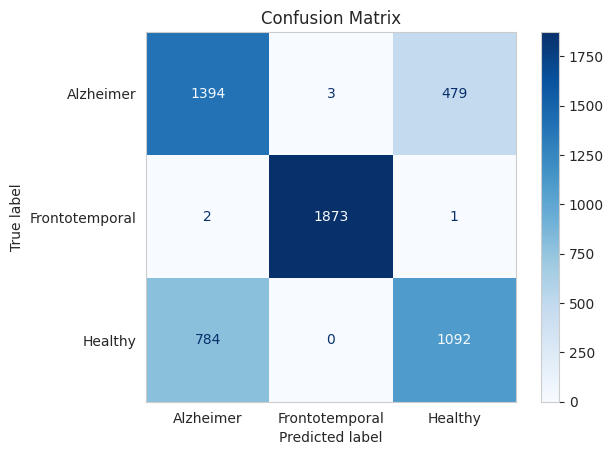


Class: Alzheimer
Sensitivity (Recall): 0.74
Specificity: 0.79

Class: Frontotemporal
Sensitivity (Recall): 1.00
Specificity: 1.00

Class: Healthy
Sensitivity (Recall): 0.58
Specificity: 0.87

Classification Report:
                precision    recall  f1-score   support

     Alzheimer       0.64      0.74      0.69      1876
Frontotemporal       1.00      1.00      1.00      1876
       Healthy       0.69      0.58      0.63      1876

      accuracy                           0.77      5628
     macro avg       0.78      0.77      0.77      5628
  weighted avg       0.78      0.77      0.77      5628



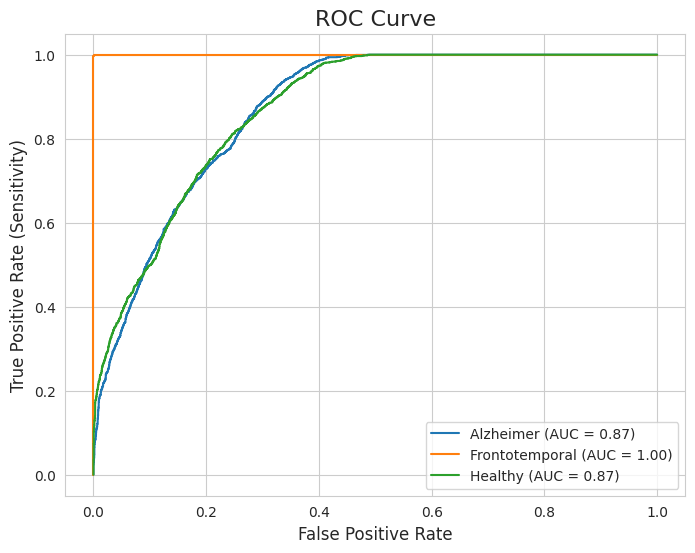

In [46]:
# --- Predict on Test Data ---
y_pred_prob = model.predict(X_test)
y_pred_classes = np.argmax(y_pred_prob, axis=1)

# Convert y_test to class labels if it's one-hot encoded
y_test_classes = (
    np.argmax(y_test, axis=1)
    if len(y_test.shape) > 1 and y_test.shape[1] > 1
    else y_test
)

# --- Evaluate Model ---
val_loss, val_accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"\nTest Loss: {val_loss:.4f}")
print(f"Test Accuracy: {val_accuracy:.4f}")

# --- Classification Metrics ---
accuracy = accuracy_score(y_test_classes, y_pred_classes)
precision = precision_score(y_test_classes, y_pred_classes, average='macro')
recall = recall_score(y_test_classes, y_pred_classes, average='macro')
f1 = f1_score(y_test_classes, y_pred_classes, average='macro')

print(f"\nAccuracy: {accuracy:.4f}")
print(f"Precision (macro avg): {precision:.4f}")
print(f"Recall (macro avg): {recall:.4f}")
print(f"F1 Score (macro avg): {f1:.4f}")

# --- Confusion Matrix ---
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)
class_names = ["Alzheimer", "Frontotemporal", "Healthy"]

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

# --- Sensitivity and Specificity per Class ---
sensitivity = {}
specificity = {}

for i, class_name in enumerate(class_names):
    TP = conf_matrix[i, i]
    FN = conf_matrix[i, :].sum() - TP
    FP = conf_matrix[:, i].sum() - TP
    TN = conf_matrix.sum() - (TP + FP + FN)
    
    sensitivity[class_name] = TP / (TP + FN) if (TP + FN) != 0 else 0.0
    specificity[class_name] = TN / (TN + FP) if (TN + FP) != 0 else 0.0

    print(f"\nClass: {class_name}")
    print(f"Sensitivity (Recall): {sensitivity[class_name]:.2f}")
    print(f"Specificity: {specificity[class_name]:.2f}")

# --- Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test_classes, y_pred_classes, target_names=class_names))

# --- ROC Curve (One-vs-Rest) ---
fpr, tpr, roc_auc = {}, {}, {}

for i in range(len(class_names)):
    y_true_binary = (y_test_classes == i).astype(int)
    fpr[i], tpr[i], _ = roc_curve(y_true_binary, y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# --- Plot ROC Curves ---
plt.figure(figsize=(8, 6))
for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.title('ROC Curve', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [47]:
# Early stopping to prevent overfitting
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=300,
    batch_size=32,
    callbacks=[early_stop],
    verbose=1
)


Epoch 1/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 15s 13ms/step - accuracy: 0.3474 - loss: 1.0971 - val_accuracy: 0.3988 - val_loss: 1.0422
Epoch 2/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.4679 - loss: 0.9906 - val_accuracy: 0.6487 - val_loss: 0.5971
Epoch 3/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6155 - loss: 0.6627 - val_accuracy: 0.7084 - val_loss: 0.4710
Epoch 4/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6468 - loss: 0.5412 - val_accuracy: 0.7080 - val_loss: 0.4652
Epoch 5/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6545 - loss: 0.5218 - val_accuracy: 0.6758 - val_loss: 0.4635
Epoch 6/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6732 - loss: 0.4979 - val_accuracy: 0.6669 - val_loss: 0.4656
Epoch 7/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6782 - loss: 0.4969 - val_accuracy: 0.7062 - val_loss: 0.4570
Epoch 8/300
563/563 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6838 - loss: 0.4847 -

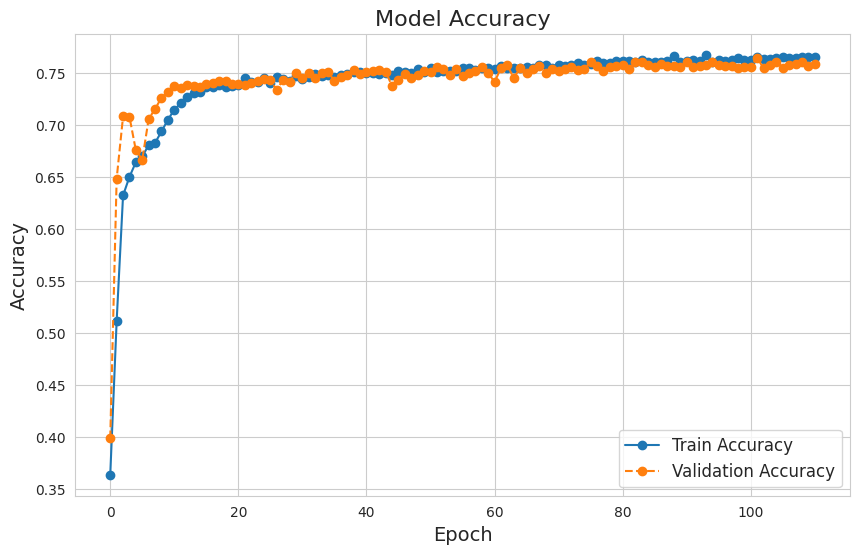

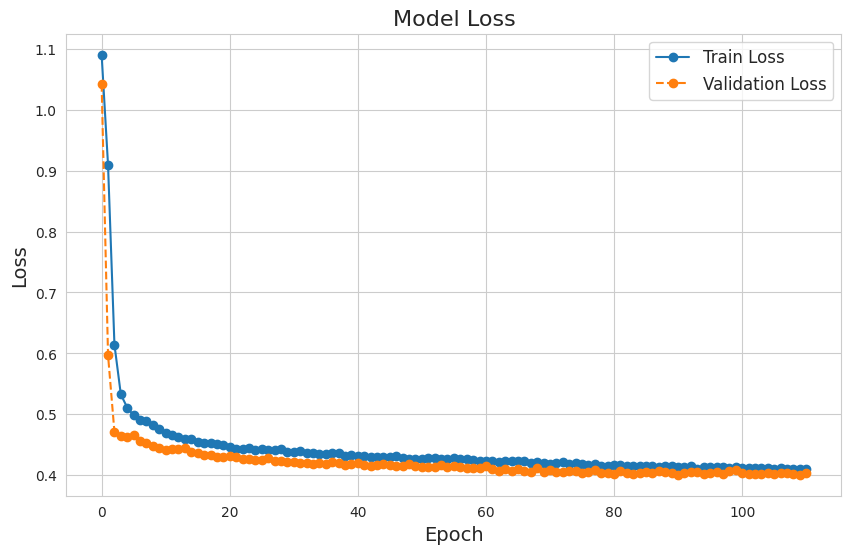

In [48]:
num_classes = 3

# Plot training history
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o', linestyle='-')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o', linestyle='--')
plt.title("Model Accuracy", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss', marker='o', linestyle='-')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o', linestyle='--')
plt.title("Model Loss", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Loss", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()


# **Model Evaluation**

176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7667 - loss: 0.4023

Test Loss: 0.4049
Test Accuracy: 0.7635

Accuracy: 0.7635
Precision (macro avg): 0.7651
Recall (macro avg): 0.7635
F1 Score (macro avg): 0.7625


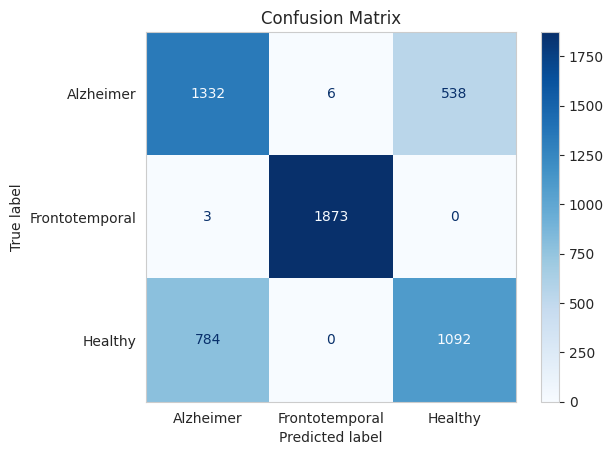


Class: Alzheimer
Sensitivity (Recall): 0.71
Specificity: 0.79

Class: Frontotemporal
Sensitivity (Recall): 1.00
Specificity: 1.00

Class: Healthy
Sensitivity (Recall): 0.58
Specificity: 0.86

Classification Report:
                precision    recall  f1-score   support

     Alzheimer       0.63      0.71      0.67      1876
Frontotemporal       1.00      1.00      1.00      1876
       Healthy       0.67      0.58      0.62      1876

      accuracy                           0.76      5628
     macro avg       0.77      0.76      0.76      5628
  weighted avg       0.77      0.76      0.76      5628



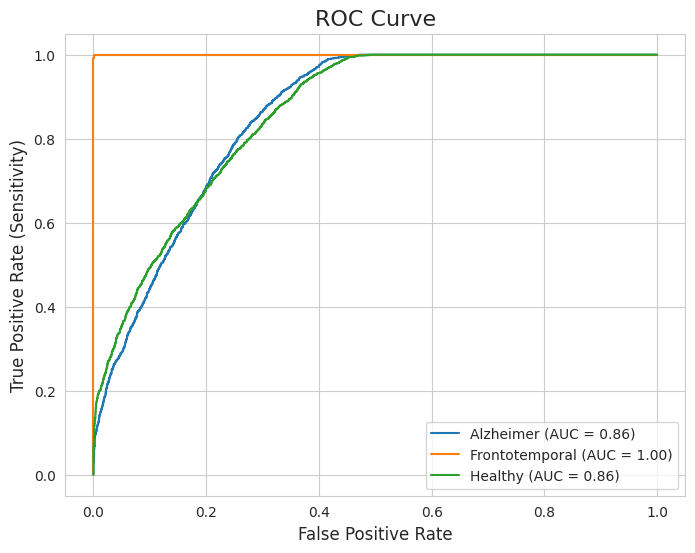

In [49]:
# --- Predict on Test Data ---
y_pred_prob = model.predict(X_test)
y_pred_classes = np.argmax(y_pred_prob, axis=1)

# Convert y_test to class labels if it's one-hot encoded
y_test_classes = (
    np.argmax(y_test, axis=1)
    if len(y_test.shape) > 1 and y_test.shape[1] > 1
    else y_test
)

# --- Evaluate Model ---
val_loss, val_accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"\nTest Loss: {val_loss:.4f}")
print(f"Test Accuracy: {val_accuracy:.4f}")

# --- Classification Metrics ---
accuracy = accuracy_score(y_test_classes, y_pred_classes)
precision = precision_score(y_test_classes, y_pred_classes, average='macro')
recall = recall_score(y_test_classes, y_pred_classes, average='macro')
f1 = f1_score(y_test_classes, y_pred_classes, average='macro')

print(f"\nAccuracy: {accuracy:.4f}")
print(f"Precision (macro avg): {precision:.4f}")
print(f"Recall (macro avg): {recall:.4f}")
print(f"F1 Score (macro avg): {f1:.4f}")

# --- Confusion Matrix ---
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)
class_names = ["Alzheimer", "Frontotemporal", "Healthy"]

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

# --- Sensitivity and Specificity per Class ---
sensitivity = {}
specificity = {}

for i, class_name in enumerate(class_names):
    TP = conf_matrix[i, i]
    FN = conf_matrix[i, :].sum() - TP
    FP = conf_matrix[:, i].sum() - TP
    TN = conf_matrix.sum() - (TP + FP + FN)
    
    sensitivity[class_name] = TP / (TP + FN) if (TP + FN) != 0 else 0.0
    specificity[class_name] = TN / (TN + FP) if (TN + FP) != 0 else 0.0

    print(f"\nClass: {class_name}")
    print(f"Sensitivity (Recall): {sensitivity[class_name]:.2f}")
    print(f"Specificity: {specificity[class_name]:.2f}")

# --- Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test_classes, y_pred_classes, target_names=class_names))

# --- ROC Curve (One-vs-Rest) ---
fpr, tpr, roc_auc = {}, {}, {}

for i in range(len(class_names)):
    y_true_binary = (y_test_classes == i).astype(int)
    fpr[i], tpr[i], _ = roc_curve(y_true_binary, y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# --- Plot ROC Curves ---
plt.figure(figsize=(8, 6))
for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.title('ROC Curve', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

ExactExplainer explainer: 5629it [07:39, 11.97it/s]                          


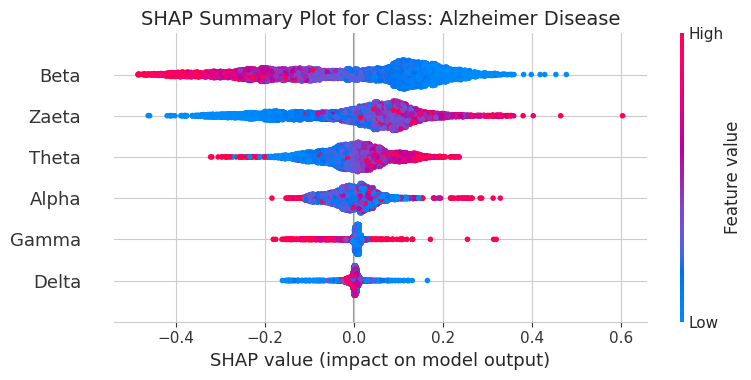

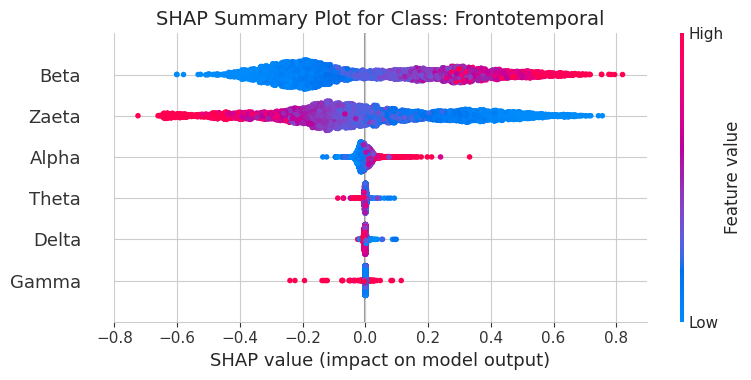

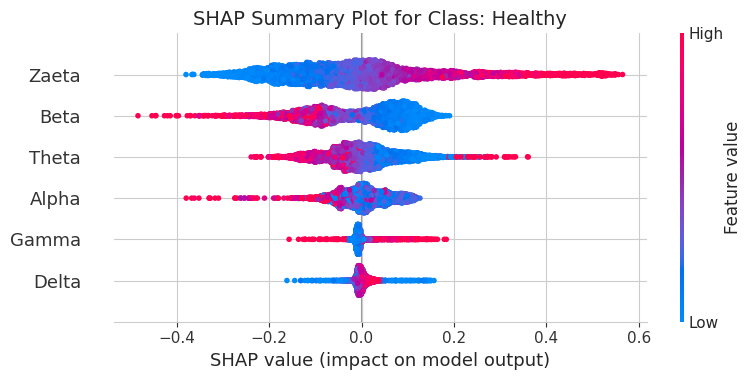

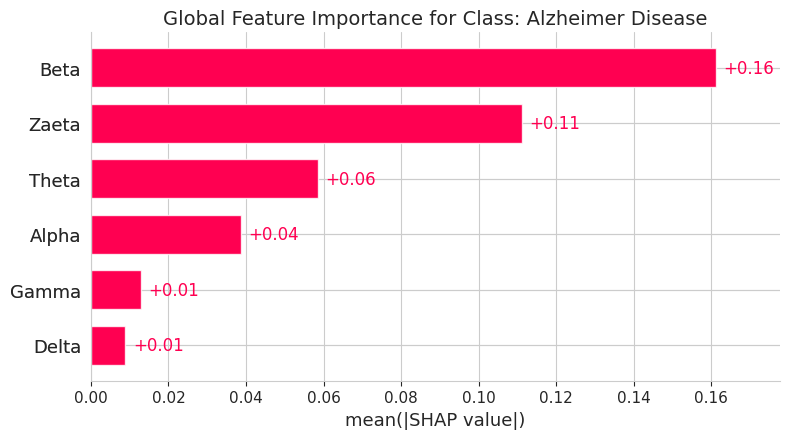

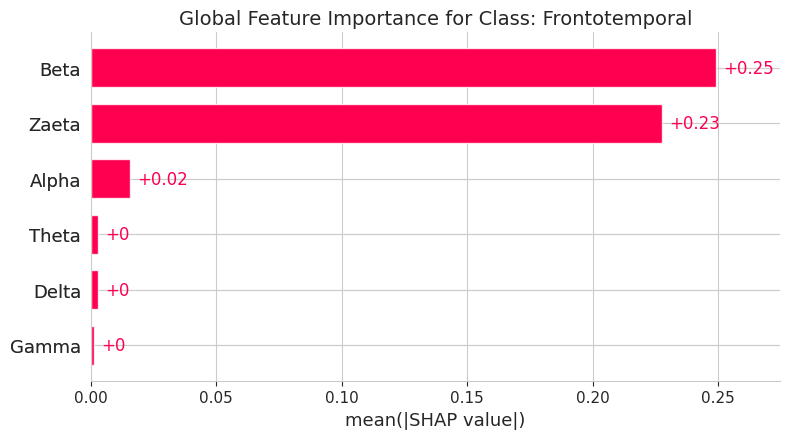

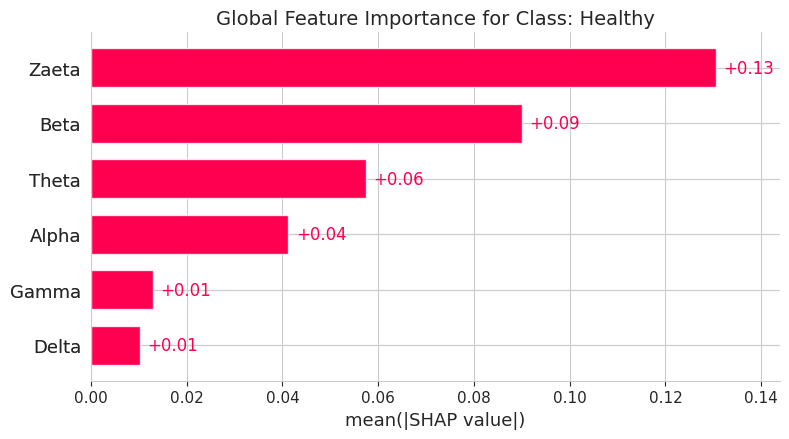

<Figure size 1000x600 with 0 Axes>

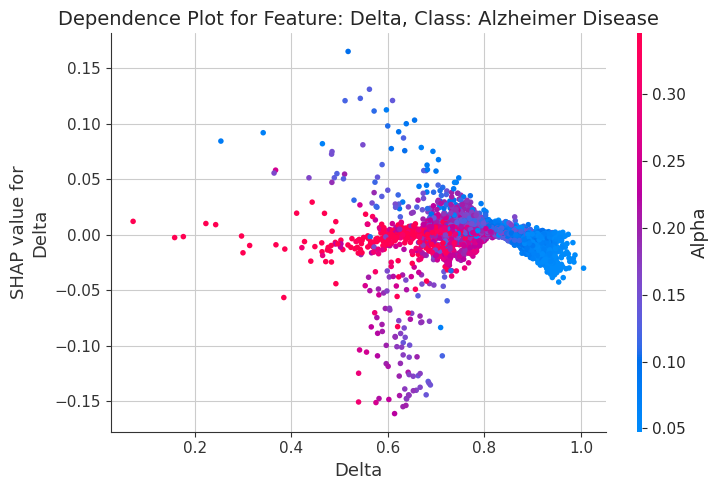

<Figure size 1000x600 with 0 Axes>

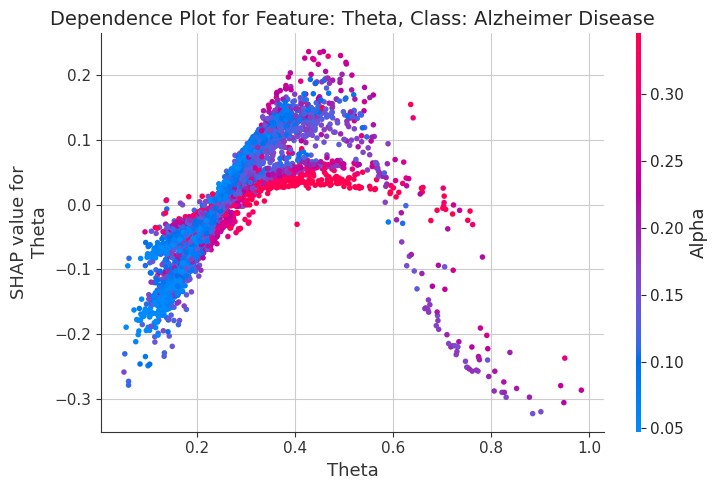

<Figure size 1000x600 with 0 Axes>

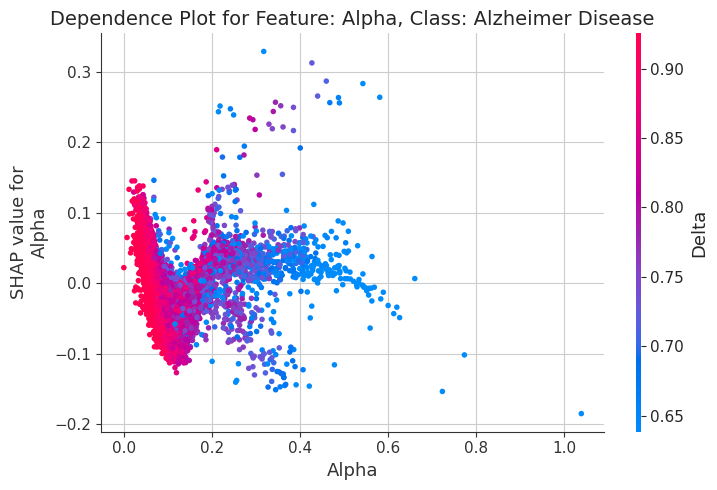

<Figure size 1000x600 with 0 Axes>

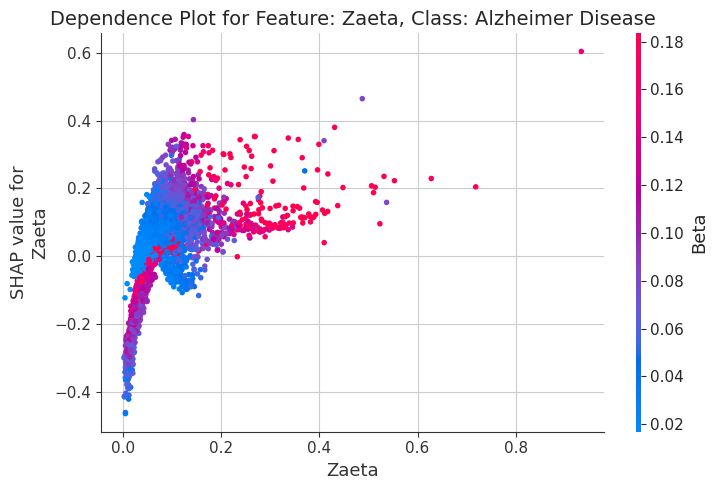

<Figure size 1000x600 with 0 Axes>

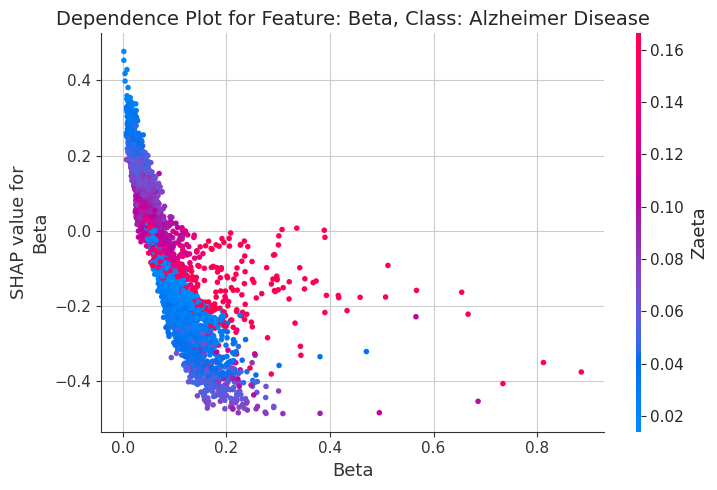

<Figure size 1000x600 with 0 Axes>

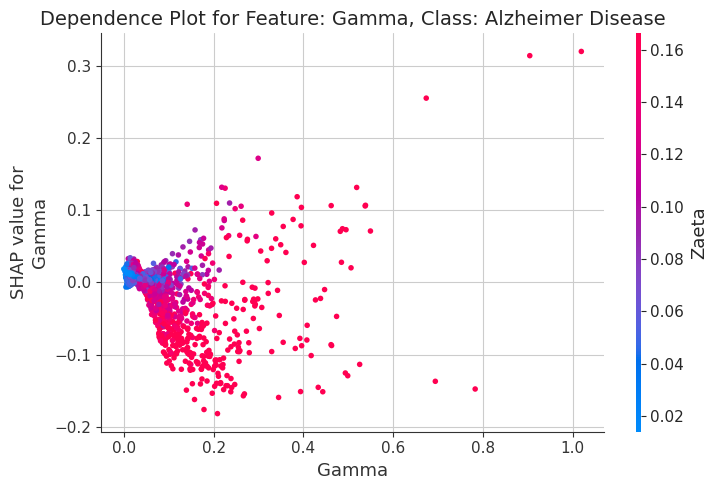

<Figure size 1000x600 with 0 Axes>

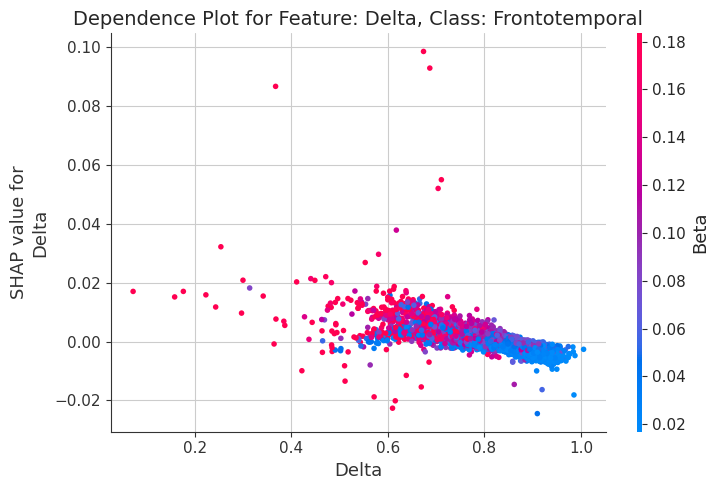

<Figure size 1000x600 with 0 Axes>

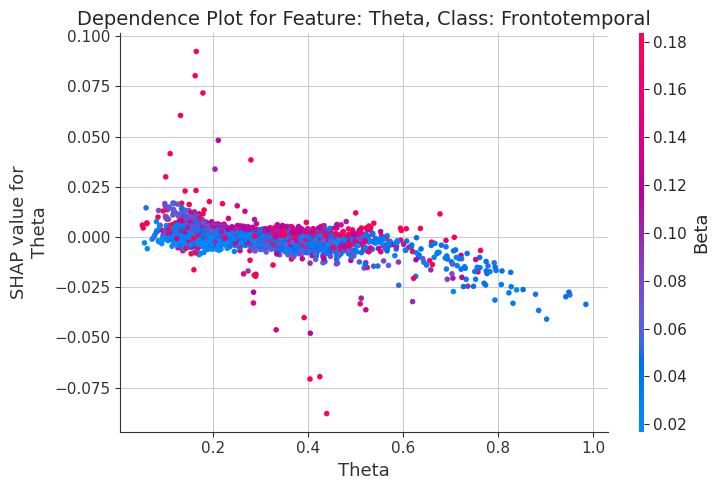

<Figure size 1000x600 with 0 Axes>

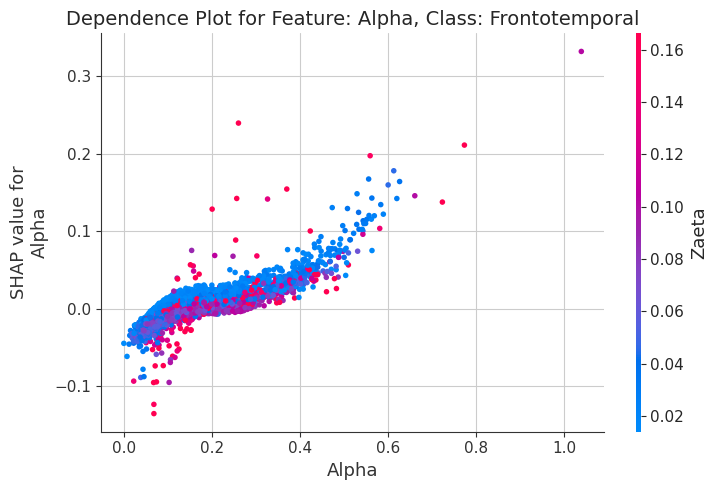

<Figure size 1000x600 with 0 Axes>

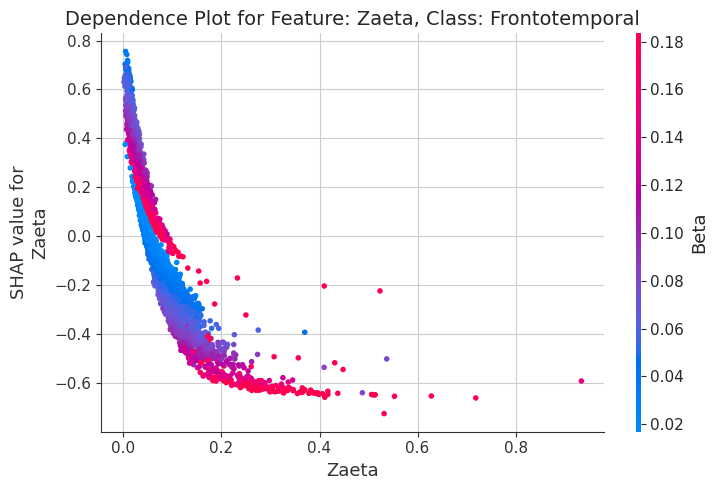

<Figure size 1000x600 with 0 Axes>

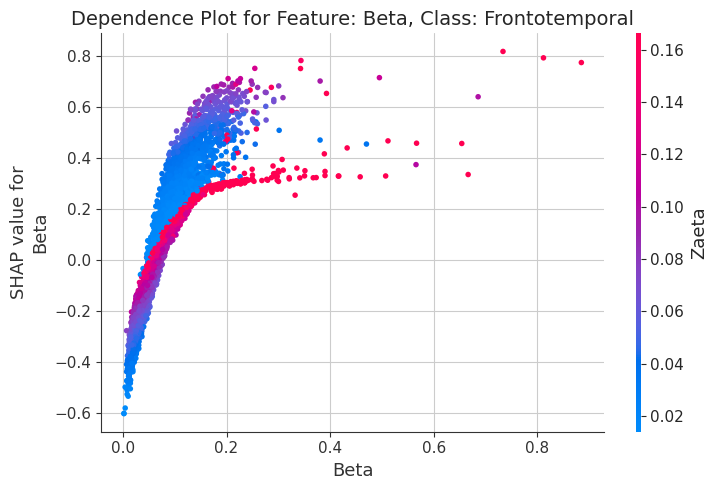

<Figure size 1000x600 with 0 Axes>

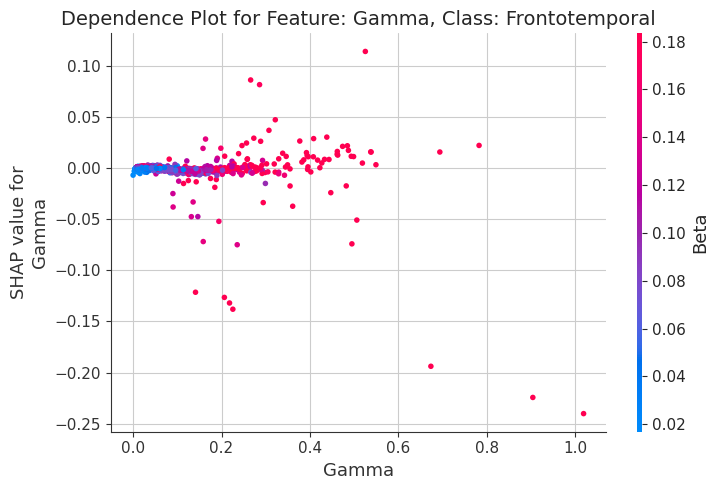

<Figure size 1000x600 with 0 Axes>

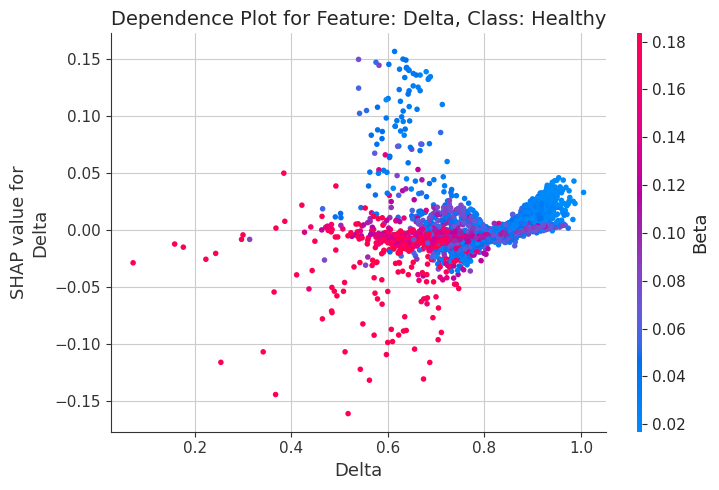

<Figure size 1000x600 with 0 Axes>

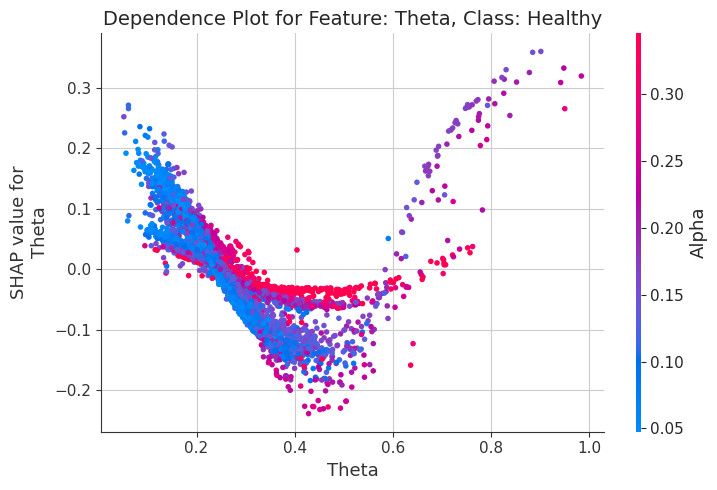

<Figure size 1000x600 with 0 Axes>

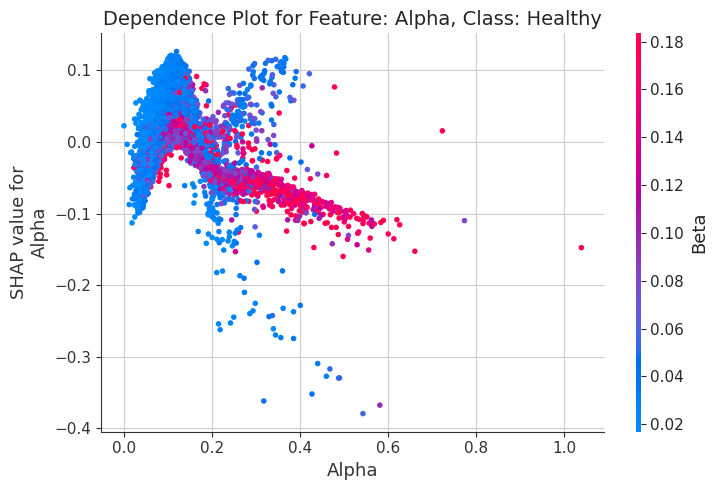

<Figure size 1000x600 with 0 Axes>

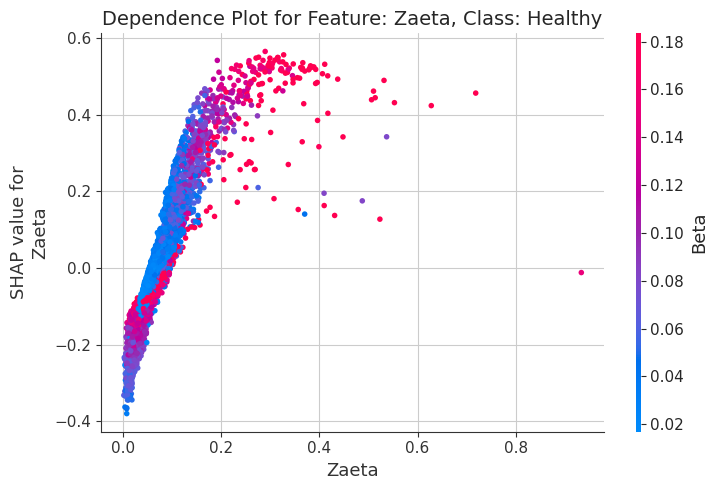

<Figure size 1000x600 with 0 Axes>

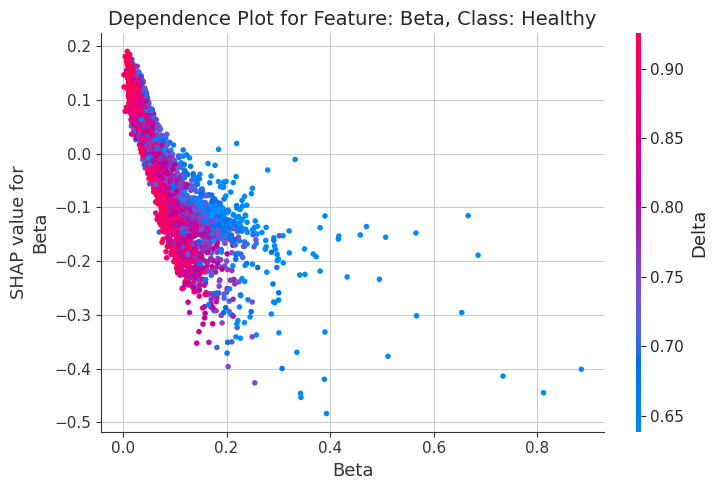

<Figure size 1000x600 with 0 Axes>

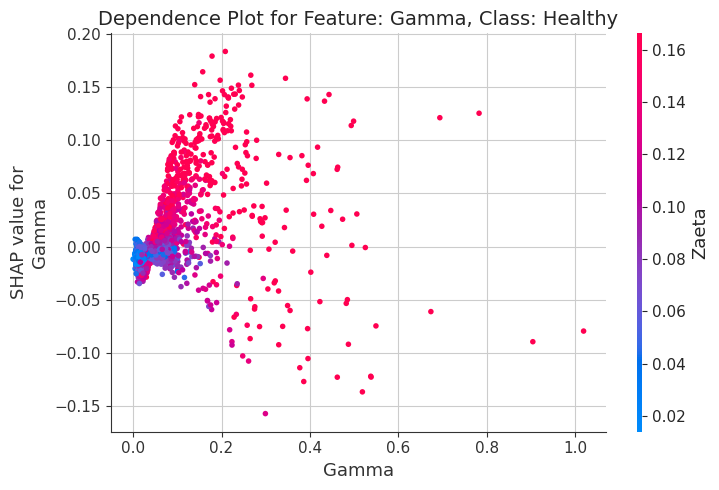

In [51]:
import shap
import pandas as pd
import matplotlib.pyplot as plt
X_test_reshaped = X_test.reshape(X_test.shape[0], -1)
X_train_reshaped = X_train.reshape(X_train.shape[0], -1)
feature_names = ["Delta", "Theta", "Alpha", "Zaeta", "Beta", "Gamma"]  
class_names = ["Alzheimer Disease","Frontotemporal", "Healthy"] 
X_train_df = pd.DataFrame(X_train_reshaped, columns=feature_names)
X_test_df = pd.DataFrame(X_test_reshaped, columns=feature_names)

explainer = shap.Explainer(model, X_train_df)

shap_values = explainer(X_test_df)
for selected_class in range(shap_values.values.shape[2]):  
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values.values[:, :, selected_class],  
        features=X_test_df,                       
        feature_names=feature_names,              
        show=False                                
    )
    plt.title(f"SHAP Summary Plot for Class: {class_names[selected_class]}", fontsize=14)
    plt.tight_layout()
    plt.show()

for selected_class in range(shap_values.values.shape[2]):  
    plt.figure(figsize=(10, 6))
    shap.plots.bar(
        shap_values[:, :, selected_class],  
        show=False                          
    )
    plt.title(f"Global Feature Importance for Class: {class_names[selected_class]}", fontsize=14)
    plt.tight_layout()
    plt.show()


for j in range(shap_values.values.shape[2]):  
    for feature in feature_names:
        plt.figure(figsize=(10, 6))
        shap.dependence_plot(
            feature,                          
            shap_values.values[:, :, j],      
            X_test_df,                        
            feature_names=feature_names,      
            show=False                        
        )
        plt.title(f"Dependence Plot for Feature: {feature}, Class: {class_names[j]}", fontsize=14)
        plt.tight_layout()
        plt.show()



In [ ]:
# Heatmap to visualize SHAP values across instances and features
for j in range(shap_values.values.shape[2]):  
    plt.figure(figsize=(12, 8))
    shap.plots.heatmap(
        shap_values[:, :, j],  
        show=False  
    )
    plt.title(f"Heatmap for Class: {class_names[j]}", fontsize=14)
    plt.tight_layout()
    plt.show()

# Binary  Classfication

In [23]:
df_binary=  pd.concat([df1, df3], axis=0)

In [24]:
df_binary.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17361 entries, 0 to 7980
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Delta   17361 non-null  float64
 1   Theta   17361 non-null  float64
 2   Alpha   17361 non-null  float64
 3   Zaeta   17361 non-null  float64
 4   Beta    17361 non-null  float64
 5   Gamma   17361 non-null  float64
 6   Label   17361 non-null  object 
dtypes: float64(6), object(1)
memory usage: 1.1+ MB


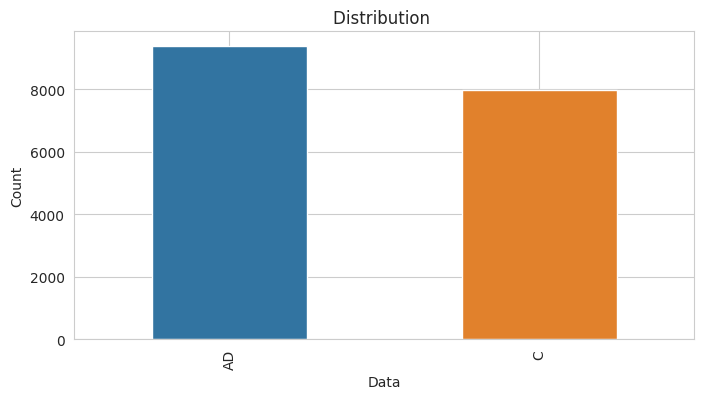

In [25]:
plt.figure(figsize=(8, 4)) 
sns.countplot(x = df_binary["Label"],width=0.5,)
plt.title("Distribution ")
plt.xlabel('Data')
plt.ylabel('Count')
plt.xticks(rotation=90)  
plt.grid(True) 
plt.show()

In [26]:
label_columns = "Label"
feature_columns = list(df_binary.columns)
feature_columns.remove(label_columns)
X = df_binary[feature_columns]
y = df_binary[label_columns]

In [27]:
cls_label_encoder = LabelEncoder()
y = cls_label_encoder.fit_transform(y)
unique_values = cls_label_encoder.classes_
print("Unique encoded values:", unique_values)

Unique encoded values: ['AD' 'C']


In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True,stratify=y)

In [29]:

scaler = MinMaxScaler(feature_range=(0,1))
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [30]:

n_classes = len(np.unique(y))
y_train = to_categorical(y_train, num_classes=n_classes)
y_test = to_categorical(y_test, num_classes=n_classes)
input_shape = X_train.shape[1:]
print(input_shape)

(6, 1)


# Binary Model Training 

In [31]:
from keras.optimizers import Adam
def residual_block(x, filters, kernel_size, dilation_rate, dropout_rate):
    # First Convolution
    conv1 = layers.Conv1D(filters, kernel_size, padding='causal', dilation_rate=dilation_rate)(x)
    norm1 = layers.BatchNormalization()(conv1)
    act1 = layers.Activation('relu')(norm1)
    drop1 = layers.SpatialDropout1D(dropout_rate)(act1)

    # Second Convolution
    conv2 = layers.Conv1D(filters, kernel_size, padding='causal', dilation_rate=dilation_rate)(drop1)
    norm2 = layers.BatchNormalization()(conv2)
    act2 = layers.Activation('relu')(norm2)
    drop2 = layers.SpatialDropout1D(dropout_rate)(act2)

    # Residual Connection
    res = layers.Conv1D(filters, 1, padding='same')(x)
    res = layers.Add()([res, drop2])

    return res

# Direct Model Building with Best Hyperparameters
def build_best_model():
    input_shape = (6, 1)  # Example input shape
    inputs = Input(shape=input_shape)
    x = inputs

    # Best TCN Hyperparameters
    tcn_blocks = 2
    tcn_filters = 32
    tcn_kernel_size = 7
    tcn_dropout_rate = 0.3
    dilation_rate = 1

    # TCN Blocks
    for _ in range(tcn_blocks):
        x = residual_block(x, tcn_filters, tcn_kernel_size, dilation_rate, tcn_dropout_rate)
        dilation_rate *= 2  # Exponentially increase dilation rate

    # Best LSTM Hyperparameters
    num_lstm_layers = 1
    lstm_units = 64

    # Add LSTM Layers
    for i in range(num_lstm_layers):
        return_sequences = i < (num_lstm_layers - 1)  # Return sequences for all but the last LSTM layer
        x = LSTM(lstm_units, return_sequences=return_sequences)(x)

    # Best MLP Hyperparameters
    mlp_layers = [
        {"units": 128, "dropout": 0.2},
        {"units": 192, "dropout": 0.2},
        {"units": 256, "dropout": 0.2},
    ]
    for layer in mlp_layers:
        x = Dense(layer["units"], activation="relu")(x)
        x = Dropout(layer["dropout"])(x)

    # Output Layer
    output_size = 2  # Adjust based on your classification task
    outputs = Dense(output_size, activation="softmax")(x)

    model = Model(inputs, outputs)

    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate= 0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

    return model

# Build and Train the Model
model = build_best_model()
model.summary()


I0000 00:00:1748109611.401721      92 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1748109611.402393      92 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 6, 1)           │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d (Conv1D)           │ (None, 6, 32)          │            256 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 6, 32)          │            128 │ conv1d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 6, 32)          │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d         │ (None, 6, 32)          │              0 │ activation[0][0]       │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_1 (Conv1D)         │ (None, 6, 32)          │          7,200 │ spatial_dropout1d[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 6, 32)          │            128 │ conv1d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 6, 32)          │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 6, 32)          │             64 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_1       │ (None, 6, 32)          │              0 │ activation_1[0][0]     │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 6, 32)          │              0 │ conv1d_2[0][0],        │
│                           │                        │                │ spatial_dropout1d_1[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_3 (Conv1D)         │ (None, 6, 32)          │          7,200 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 6, 32)          │            128 │ conv1d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 6, 32)          │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_2       │ (None, 6, 32)          │              0 │ activation_2[0][0]     │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_4 (Conv1D)         │ (None, 6, 32)          │          7,200 │ spatial_dropout1d_2[0… │
├──────────────────────

 Total params: 131,330 (513.01 KB)

 Trainable params: 131,074 (512.01 KB)

 Non-trainable params: 256 (1.00 KB)

In [33]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)
fold = 1
val_accuracies = []

for train_idx, val_idx in kf.split(X_train):
    print(f"\n--- Fold {fold} ---")

    X_fold_train, X_fold_val = X_train[train_idx], X_train[val_idx]
    y_fold_train, y_fold_val = y_train[train_idx], y_train[val_idx]

    

    early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

    history = model.fit(
        X_fold_train, y_fold_train,
        validation_data=(X_fold_val, y_fold_val),
        epochs=300,
        batch_size=32,
        callbacks=[early_stop],
        verbose=1
    )

    val_loss, val_acc = model.evaluate(X_fold_val, y_fold_val, verbose=0)
    val_accuracies.append(val_acc)
    print(f"Fold {fold} Validation Accuracy: {val_acc:.4f}")
    fold += 1

print(f"\nAverage Validation Accuracy across 5 folds: {np.mean(val_accuracies):.4f}")



--- Fold 1 ---
Epoch 1/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9966 - loss: 0.0064 - val_accuracy: 0.9975 - val_loss: 0.0066
Epoch 2/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.9971 - val_loss: 0.0048
Epoch 3/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.9978 - loss: 0.0045 - val_accuracy: 0.9975 - val_loss: 0.0044
Epoch 4/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9978 - loss: 0.0043 - val_accuracy: 0.9964 - val_loss: 0.0052
Epoch 5/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.9978 - val_loss: 0.0043
Epoch 6/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.9971 - val_loss: 0.0051
Epoch 7/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.9971 - val_loss: 0.0045
Epoch 8/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.9983 -

In [64]:
# Early stopping to prevent overfitting
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=300,
    batch_size=32,
    callbacks=[early_stop],
    verbose=1
)


Epoch 1/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.5459 - loss: 0.6861 - val_accuracy: 0.4863 - val_loss: 0.6763
Epoch 2/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6975 - loss: 0.5766 - val_accuracy: 0.9251 - val_loss: 0.2778
Epoch 3/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.8625 - loss: 0.3299 - val_accuracy: 0.9867 - val_loss: 0.0485
Epoch 4/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9366 - loss: 0.1700 - val_accuracy: 0.9971 - val_loss: 0.0174
Epoch 5/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9701 - loss: 0.0890 - val_accuracy: 0.9968 - val_loss: 0.0149
Epoch 6/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9753 - loss: 0.0716 - val_accuracy: 0.9971 - val_loss: 0.0141
Epoch 7/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9785 - loss: 0.0625 - val_accuracy: 0.9968 - val_loss: 0.0143
Epoch 8/300
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9869 - loss: 0.0449 -

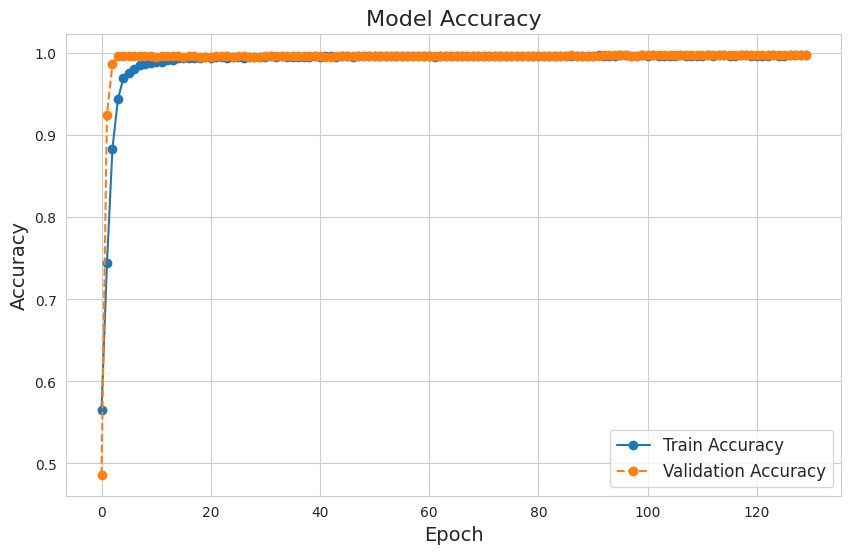

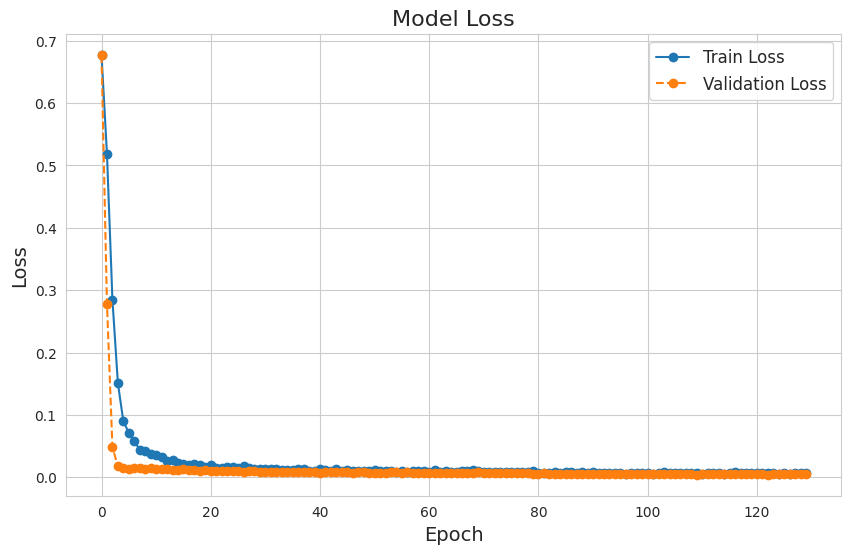

In [65]:
num_classes = 2

# Plot training history
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o', linestyle='-')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o', linestyle='--')
plt.title("Model Accuracy", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss', marker='o', linestyle='-')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o', linestyle='--')
plt.title("Model Loss", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Loss", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()


109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9978 - loss: 0.0073

Test Loss: 0.0048
Test Accuracy: 0.9986

Accuracy: 0.9986
Precision (macro avg): 0.9985
Recall (macro avg): 0.9986
F1 Score (macro avg): 0.9986


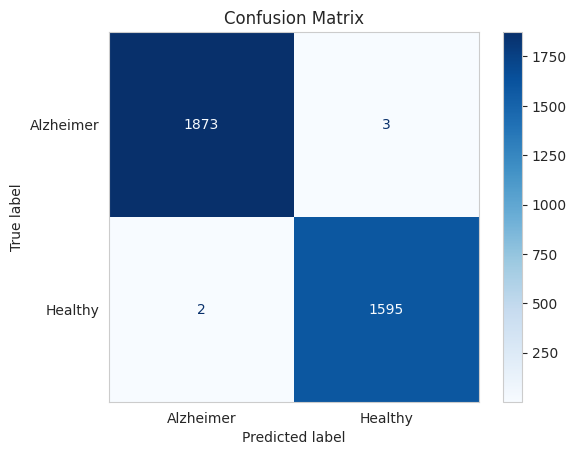


Class: Alzheimer
Sensitivity (Recall): 1.00
Specificity: 1.00

Class: Healthy
Sensitivity (Recall): 1.00
Specificity: 1.00

Classification Report:
              precision    recall  f1-score   support

   Alzheimer       1.00      1.00      1.00      1876
     Healthy       1.00      1.00      1.00      1597

    accuracy                           1.00      3473
   macro avg       1.00      1.00      1.00      3473
weighted avg       1.00      1.00      1.00      3473



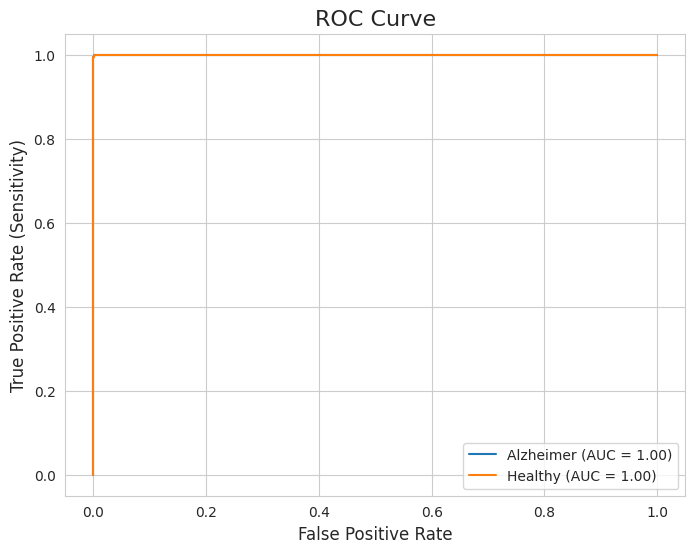

In [66]:
# --- Predict on Test Data ---
y_pred_prob = model.predict(X_test)
y_pred_classes = np.argmax(y_pred_prob, axis=1)

# Convert y_test to class labels if it's one-hot encoded
y_test_classes = (
    np.argmax(y_test, axis=1)
    if len(y_test.shape) > 1 and y_test.shape[1] > 1
    else y_test
)

# --- Evaluate Model ---
val_loss, val_accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"\nTest Loss: {val_loss:.4f}")
print(f"Test Accuracy: {val_accuracy:.4f}")

# --- Classification Metrics ---
accuracy = accuracy_score(y_test_classes, y_pred_classes)
precision = precision_score(y_test_classes, y_pred_classes, average='macro')
recall = recall_score(y_test_classes, y_pred_classes, average='macro')
f1 = f1_score(y_test_classes, y_pred_classes, average='macro')

print(f"\nAccuracy: {accuracy:.4f}")
print(f"Precision (macro avg): {precision:.4f}")
print(f"Recall (macro avg): {recall:.4f}")
print(f"F1 Score (macro avg): {f1:.4f}")

# --- Confusion Matrix ---
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)
class_names = ["Alzheimer", "Healthy"]

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

# --- Sensitivity and Specificity per Class ---
sensitivity = {}
specificity = {}

for i, class_name in enumerate(class_names):
    TP = conf_matrix[i, i]
    FN = conf_matrix[i, :].sum() - TP
    FP = conf_matrix[:, i].sum() - TP
    TN = conf_matrix.sum() - (TP + FP + FN)
    
    sensitivity[class_name] = TP / (TP + FN) if (TP + FN) != 0 else 0.0
    specificity[class_name] = TN / (TN + FP) if (TN + FP) != 0 else 0.0

    print(f"\nClass: {class_name}")
    print(f"Sensitivity (Recall): {sensitivity[class_name]:.2f}")
    print(f"Specificity: {specificity[class_name]:.2f}")

# --- Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test_classes, y_pred_classes, target_names=class_names))

# --- ROC Curve (One-vs-Rest) ---
fpr, tpr, roc_auc = {}, {}, {}

for i in range(len(class_names)):
    y_true_binary = (y_test_classes == i).astype(int)
    fpr[i], tpr[i], _ = roc_curve(y_true_binary, y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# --- Plot ROC Curves ---
plt.figure(figsize=(8, 6))
for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.title('ROC Curve', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [67]:
counter = Counter(y)
print(counter)
oversample = SMOTE(random_state=42)
X, y = oversample.fit_resample(X, y)
counter = Counter(y)
print(counter)

Counter({0: 9380, 1: 7981})
Counter({0: 9380, 1: 9380})


In [68]:
cls_label_encoder = LabelEncoder()
y = cls_label_encoder.fit_transform(y)
unique_values = cls_label_encoder.classes_
print("Unique encoded values:", unique_values)

Unique encoded values: [0 1]


In [69]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True,stratify=y)

In [70]:

scaler = MinMaxScaler(feature_range=(0,1))
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))


n_classes = len(np.unique(y))
y_train = to_categorical(y_train, num_classes=n_classes)
y_test = to_categorical(y_test, num_classes=n_classes)
input_shape = X_train.shape[1:]
print(input_shape)

from keras.optimizers import Adam
def residual_block(x, filters, kernel_size, dilation_rate, dropout_rate):
    # First Convolution
    conv1 = layers.Conv1D(filters, kernel_size, padding='causal', dilation_rate=dilation_rate)(x)
    norm1 = layers.BatchNormalization()(conv1)
    act1 = layers.Activation('relu')(norm1)
    drop1 = layers.SpatialDropout1D(dropout_rate)(act1)

    # Second Convolution
    conv2 = layers.Conv1D(filters, kernel_size, padding='causal', dilation_rate=dilation_rate)(drop1)
    norm2 = layers.BatchNormalization()(conv2)
    act2 = layers.Activation('relu')(norm2)
    drop2 = layers.SpatialDropout1D(dropout_rate)(act2)

    # Residual Connection
    res = layers.Conv1D(filters, 1, padding='same')(x)
    res = layers.Add()([res, drop2])

    return res

# Direct Model Building with Best Hyperparameters
def build_best_model():
    input_shape = (6, 1)  # Example input shape
    inputs = Input(shape=input_shape)
    x = inputs

    # Best TCN Hyperparameters
    tcn_blocks = 2
    tcn_filters = 32
    tcn_kernel_size = 7
    tcn_dropout_rate = 0.3
    dilation_rate = 1

    # TCN Blocks
    for _ in range(tcn_blocks):
        x = residual_block(x, tcn_filters, tcn_kernel_size, dilation_rate, tcn_dropout_rate)
        dilation_rate *= 2  # Exponentially increase dilation rate

    # Best LSTM Hyperparameters
    num_lstm_layers = 1
    lstm_units = 64

    # Add LSTM Layers
    for i in range(num_lstm_layers):
        return_sequences = i < (num_lstm_layers - 1)  # Return sequences for all but the last LSTM layer
        x = LSTM(lstm_units, return_sequences=return_sequences)(x)

    # Best MLP Hyperparameters
    mlp_layers = [
        {"units": 128, "dropout": 0.2},
        {"units": 192, "dropout": 0.2},
        {"units": 256, "dropout": 0.2},
    ]
    for layer in mlp_layers:
        x = Dense(layer["units"], activation="relu")(x)
        x = Dropout(layer["dropout"])(x)

    # Output Layer
    output_size = 2  # Adjust based on your classification task
    outputs = Dense(output_size, activation="softmax")(x)

    model = Model(inputs, outputs)

    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate= 0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

    return model

# Build and Train the Model
model = build_best_model()
model.summary()


(6, 1)


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 6, 1)           │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_24 (Conv1D)        │ (None, 6, 32)          │            256 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_16    │ (None, 6, 32)          │            128 │ conv1d_24[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_16             │ (None, 6, 32)          │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_16      │ (None, 6, 32)          │              0 │ activation_16[0][0]    │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_25 (Conv1D)        │ (None, 6, 32)          │          7,200 │ spatial_dropout1d_16[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_17    │ (None, 6, 32)          │            128 │ conv1d_25[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_17             │ (None, 6, 32)          │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_26 (Conv1D)        │ (None, 6, 32)          │             64 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_17      │ (None, 6, 32)          │              0 │ activation_17[0][0]    │
│ (SpatialDropout1D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_8 (Add)               │ (None, 6, 32)          │              0 │ conv1d_26[0][0],       │
│                           │                        │                │ spatial_dropout1d_17[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_27 (Conv1D)        │ (None, 6, 32)          │          7,200 │ add_8[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_18    │ (None, 6, 32)          │            128 │ conv1d_27[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_18             │ (None, 6, 32)          │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout1d_18 

 Total params: 131,330 (513.01 KB)

 Trainable params: 131,074 (512.01 KB)

 Non-trainable params: 256 (1.00 KB)

Epoch 1/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.5291 - loss: 0.6905 - val_accuracy: 0.5030 - val_loss: 0.6548
Epoch 2/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7305 - loss: 0.5412 - val_accuracy: 0.9654 - val_loss: 0.1362
Epoch 3/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8973 - loss: 0.2512 - val_accuracy: 0.9917 - val_loss: 0.0261
Epoch 4/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.9535 - loss: 0.1178 - val_accuracy: 0.9970 - val_loss: 0.0119
Epoch 5/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.9767 - loss: 0.0638 - val_accuracy: 0.9970 - val_loss: 0.0099
Epoch 6/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.9848 - loss: 0.0468 - val_accuracy: 0.9973 - val_loss: 0.0099
Epoch 7/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.9877 - loss: 0.0392 - val_accuracy: 0.9967 - val_loss: 0.0109
Epoch 8/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.9904 - loss: 0.0323 -

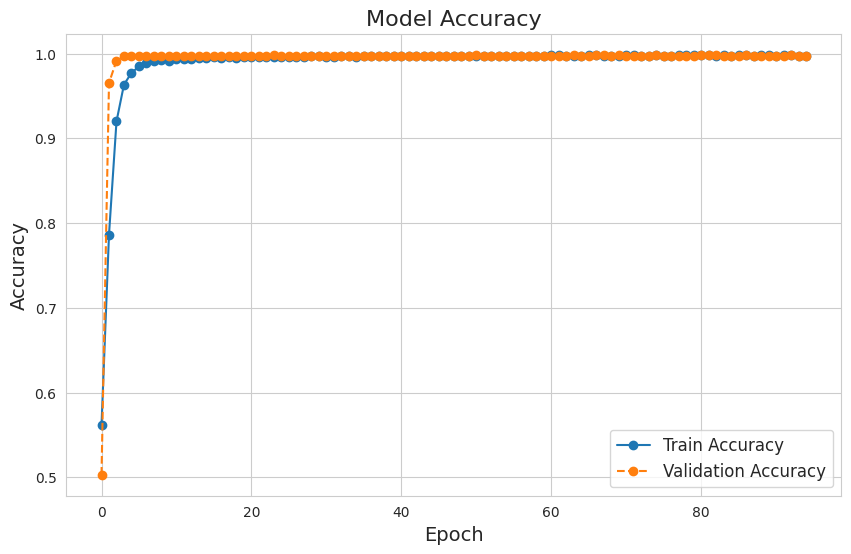

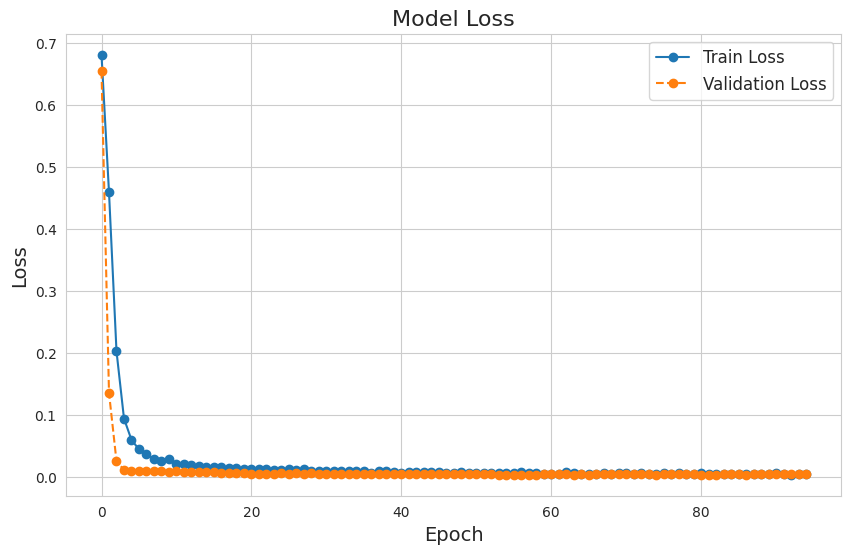

In [71]:
# Early stopping to prevent overfitting
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=300,
    batch_size=32,
    callbacks=[early_stop],
    verbose=1
)

num_classes = 2

# Plot training history
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o', linestyle='-')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o', linestyle='--')
plt.title("Model Accuracy", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss', marker='o', linestyle='-')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o', linestyle='--')
plt.title("Model Loss", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Loss", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()


118/118 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
118/118 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9977 - loss: 0.0085

Test Loss: 0.0086
Test Accuracy: 0.9971

Accuracy: 0.9971
Precision (macro avg): 0.9971
Recall (macro avg): 0.9971
F1 Score (macro avg): 0.9971


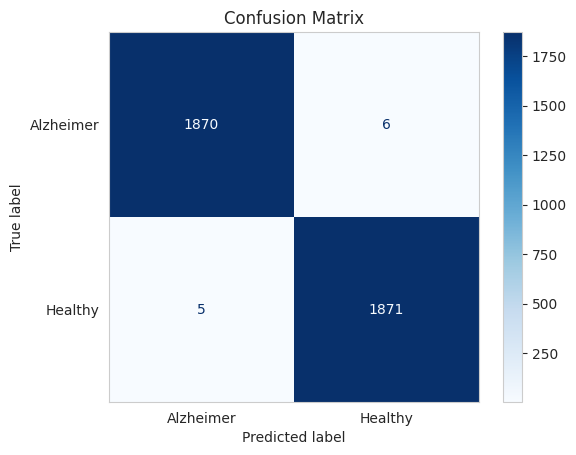


Class: Alzheimer
Sensitivity (Recall): 1.00
Specificity: 1.00

Class: Healthy
Sensitivity (Recall): 1.00
Specificity: 1.00

Classification Report:
              precision    recall  f1-score   support

   Alzheimer       1.00      1.00      1.00      1876
     Healthy       1.00      1.00      1.00      1876

    accuracy                           1.00      3752
   macro avg       1.00      1.00      1.00      3752
weighted avg       1.00      1.00      1.00      3752



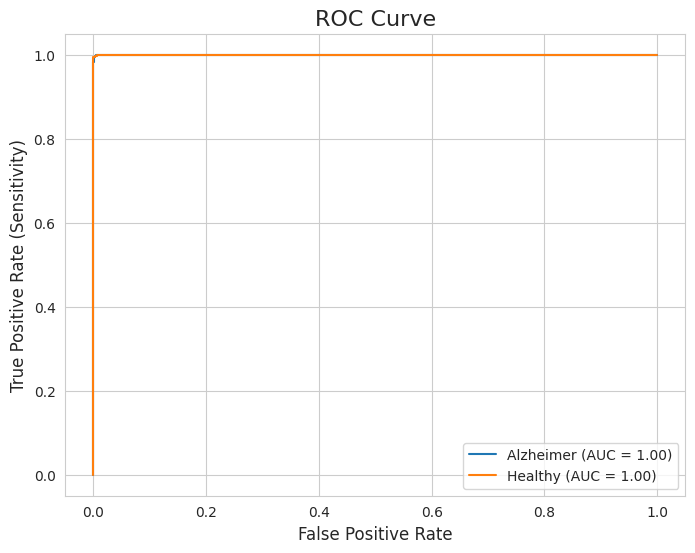

In [72]:
# --- Predict on Test Data ---
y_pred_prob = model.predict(X_test)
y_pred_classes = np.argmax(y_pred_prob, axis=1)

# Convert y_test to class labels if it's one-hot encoded
y_test_classes = (
    np.argmax(y_test, axis=1)
    if len(y_test.shape) > 1 and y_test.shape[1] > 1
    else y_test
)

# --- Evaluate Model ---
val_loss, val_accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"\nTest Loss: {val_loss:.4f}")
print(f"Test Accuracy: {val_accuracy:.4f}")

# --- Classification Metrics ---
accuracy = accuracy_score(y_test_classes, y_pred_classes)
precision = precision_score(y_test_classes, y_pred_classes, average='macro')
recall = recall_score(y_test_classes, y_pred_classes, average='macro')
f1 = f1_score(y_test_classes, y_pred_classes, average='macro')

print(f"\nAccuracy: {accuracy:.4f}")
print(f"Precision (macro avg): {precision:.4f}")
print(f"Recall (macro avg): {recall:.4f}")
print(f"F1 Score (macro avg): {f1:.4f}")

# --- Confusion Matrix ---
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)
class_names = ["Alzheimer", "Healthy"]

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

# --- Sensitivity and Specificity per Class ---
sensitivity = {}
specificity = {}

for i, class_name in enumerate(class_names):
    TP = conf_matrix[i, i]
    FN = conf_matrix[i, :].sum() - TP
    FP = conf_matrix[:, i].sum() - TP
    TN = conf_matrix.sum() - (TP + FP + FN)
    
    sensitivity[class_name] = TP / (TP + FN) if (TP + FN) != 0 else 0.0
    specificity[class_name] = TN / (TN + FP) if (TN + FP) != 0 else 0.0

    print(f"\nClass: {class_name}")
    print(f"Sensitivity (Recall): {sensitivity[class_name]:.2f}")
    print(f"Specificity: {specificity[class_name]:.2f}")

# --- Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test_classes, y_pred_classes, target_names=class_names))

# --- ROC Curve (One-vs-Rest) ---
fpr, tpr, roc_auc = {}, {}, {}

for i in range(len(class_names)):
    y_true_binary = (y_test_classes == i).astype(int)
    fpr[i], tpr[i], _ = roc_curve(y_true_binary, y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# --- Plot ROC Curves ---
plt.figure(figsize=(8, 6))
for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.title('ROC Curve', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()